# Publications

### Adaptive compressed sensing of Raman spectroscopic profiling data for discriminative tasks [J]. Talanta, SCI, IF 6.057. JCR Q1, 2020, doi: 10.1016/j.talanta.2019.120681

<hr/>

# Compressed Sensing

Sampling
$$ xs = \Phi x ,\quad for \quad \Phi_{k*N}, k > （4 * non-sparsity） $$

Sparsity hypothesis
$$ x = \Psi z $$

Compressed Sensing
$$ x_s = \Phi \Psi z $$

Optimization (LASSO)
$$ minimize \quad  ||z||_1 $$
$$ s.t \quad     x_s = \Phi \Psi z $$

Reconstruction
$$ x = \Psi z $$

### $\Psi$ 

Unitary matrix : 
if its conjugate transpose is also its inverse, i.e. $\Psi^H = \Psi^{-1}$

The real analogue of a unitary matrix is an orthogonal matrix. Unitary matrices have significant importance in quantum mechanics because they preserve norms, and thus, probability amplitudes.  

The matrix $\Psi$ is a unitary matrix. It can be:    

DCT $C$, 

DWT $W$

DFT $F$, e.g. used in medical imaging

Hadamard-Walsh matrix $H$, e.g. used in signal processing

define $A = \Phi \Psi$, 

$ 
xs_{k × 1}=A_{k × n}z_{n × 1}
$


$
A = [a_1, a_2, ..., a_n]
$

a is column vector / atom / dictionary entry, 

A is overcomplete. i.e. k < n. More dictionary entries (non-repetive), more expressiveness, higher sparsity is possible.

A is also full row rank, i.e. rank(A) = k   

$ x_s=Az$ has many solutions. The constraint is an underdetermined linear system who has more unknowns than
equations. 

Find the most sparse one by minimize L1(z) ||z||1. Don't use L0 because minimize ||z||0 is NP hard. 

objective: minimize ||z||  
subject to: $ x_s=Az$, or $z = A^T (AA^T)^{-1}xs + V[k:,:] v $, $A = USV^T $, $v$ is a freely chosen (n-k) × 1 vector .  



Coherence Between Two Bases  

[A B] 

$\mu(A,B) = \sqrt{n} \underset{0 \leq i,j<n} {max}(a_i^Tb_j) $
a and b are column vectors in A and B  
$ 0 \leq \mu(A,B) \leq \sqrt{n} $  

We are interested in bases pairs with small coherence and in that case we say the two bases are
incoherent. In the case of dictionaries for sparse representation, the incoherence is important because
a small μ means small correlation between the two bases, thus a dictionary composed by such a
pair of bases has a “richer vocabulary” relative to a dictionary with a larger μ .  

μ(I, C) = $\sqrt 2$   
μ(I, F) = 1  
μ(I, H) = 1  


Old fashined sampling: $x_s = Ix$, I is identity matrix.   

CS sampling:  
$z_{𝑛×1} = \Psi^{T}_{𝑛×n} x_{𝑛×1}$, $\Psi$ can be DFT, DCT, etc. Convert the non-sparse x to sparse z    
non-adaptive in the sense that compressibility property holds for any signals as long as they have structures  
$x_s = \hat \Phi_{k×n}  z_{𝑛×1} $, k << n. $\hat \Phi$ is the sampling matrix. It is a subset of $\Phi$  

objective: minimize ||$\Psi^{T} x$||,  s.t. $ \hat \Phi \Psi^{T} x = x_s$

k >= 4 r (r is number of zeros in the signal, degree of sparsity)  
four-to-one practical / empirical rule :  for exact reconstruction, one needs
about four incoherent measurements per unknown nonzero term

## Reconstruction

Objective: minimize ||$\Psi^{T} x$||,  s.t. $ \hat \Phi \Psi^{T} x = x_s$  ==> get $\Psi^{T} x$  
==> x = $\Psi (\Psi^{T} x ) $  

In [1]:
!pip install cs1==0.1.1

In [2]:
import cs1.domain.image

# DCT

## Example of Image (2D)

## DCT

The function `dctmtx()` generates the n-by-n discrete cosine transform (DCT) matrix. 

$$ DCT_{M,N} = {\frac{1}{\sqrt{N}}}
 \begin{bmatrix}
  1 & 1 & \cdots & 1 \\
  \sqrt{2}cos({\frac{\pi}{2N}}) & \sqrt{2}cos({\frac{3\pi}{2N}}) & \cdots & \sqrt{2}cos({\frac{(2N-1)\pi}{2N}}) \\
  \vdots  & \vdots  & \ddots & \vdots  \\
  \sqrt{2}cos({\frac{(M-1)\pi}{2N}}) & \sqrt{2}cos({\frac{3(M-1)\pi}{2N}}) & \cdots & \sqrt{2}cos({\frac{(2N-1)(M-1)\pi}{2N}}) \\
 \end{bmatrix} 
 $$

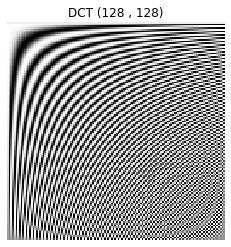

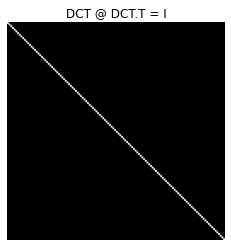

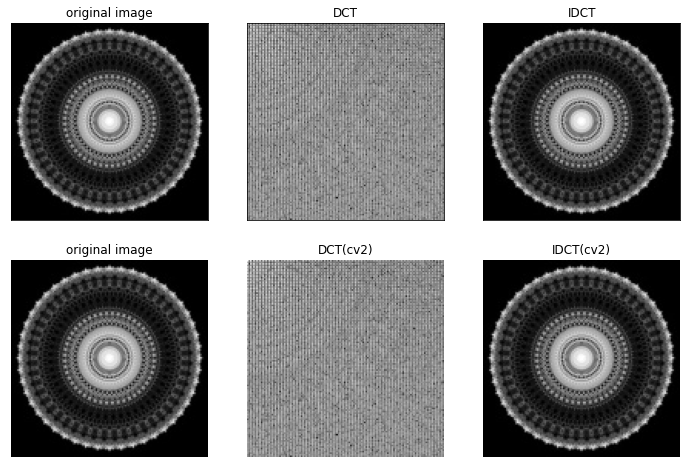

Laplacian var (Blur Detection) of DCT =  67.21
Laplacian var (Blur Detection) of DCT (cv2) =  67.21


In [3]:
cs1.domain.image.img_dct('symmetry.jpg')

The dst (after DCT transformation) becomes SPARSE.

## DFT

### Generate  the n-by-n discrete fourier transform (DFT) matrix


The function `dftmtx()` generate the n-by-n discrete fourier transform (DFT) matrix

$$ DFT_{N,N} = \left( {\frac{\omega^{jk}}{\sqrt{N}}} \right) _{j,k=0,...,N-1} = {\frac{1}{\sqrt{N}}}
 \begin{bmatrix}
  \omega^0 & \omega^0 & \omega^0 & \cdots & \omega^0 \\
  \omega^0 & \omega^1 & \omega^2 & \cdots &  \omega^{N-1} \\
  \omega^0 & \omega^2 & \omega^4 & \cdots &  \omega^{2(N-1)} \\
  \omega^0 & \omega^3 & \omega^6 & \cdots &  \omega^{3(N-1)} \\
  \vdots  & \vdots & \vdots  & \ddots & \vdots  \\
  \omega^0 & \omega^{N-1} & \omega^{2(N-1)} & \cdots &  \omega^{(N-1)(N-1)} \\
 \end{bmatrix} $$
 
where $$ \omega = e^{-2 \pi i / N} = cos (-2 \pi / N) + i sin(-2 \pi / N) $$

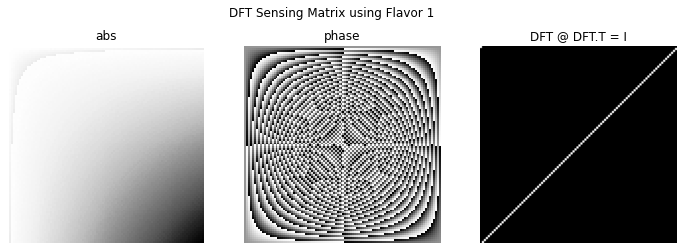

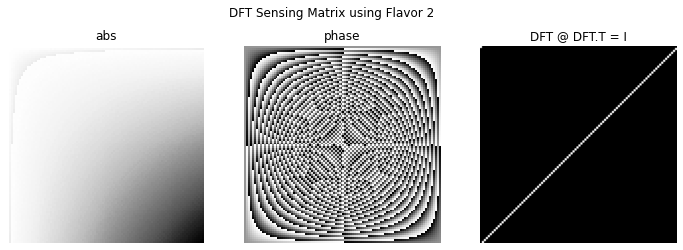

In [4]:
import cs1.basis.common

mtx = cs1.basis.common.dftmtx(100, flavor = 1)
mtx = cs1.basis.common.dftmtx(100, flavor = 2)

image cropped to  128  x  128


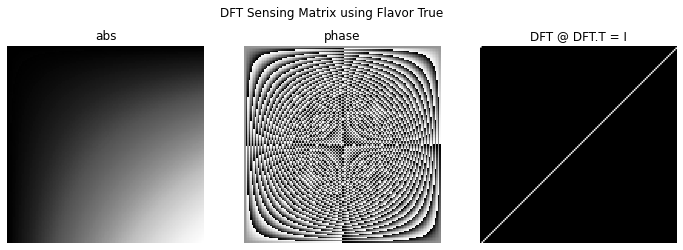

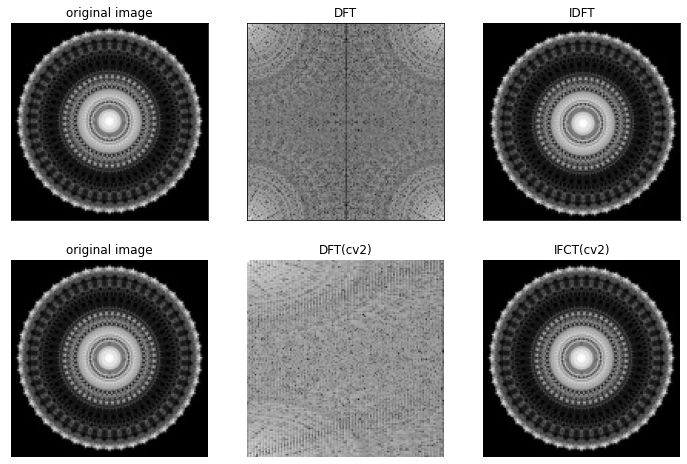

Laplacian var (Blur Detection) of DFT =  13.498
Laplacian var (Blur Detection) of DFT (cv2) =  23.662


In [5]:
cs1.domain.image.img_dft('symmetry.jpg')

## HWT 

The Hadamard-Walsh transform (HWT) matrix requires the dimension to be $2^N$.  
In function `hwtmtx()`, we will round the input parameter to its next $2^N$ value. 

$$ HWT_{(2^N)} = {\frac{1}{\sqrt{N/2}}}
 \begin{bmatrix}
  1 & 1 & 1 & 1 & \cdots & 1 & 1 \\
  1 & -1 & 1 & -1 & \cdots &  1 & -1 \\
  1 & 1 & 1 & 1 & \cdots & 1 & 1 \\
  1 & -1 & 1 & -1 & \cdots &  1 & -1 \\
  \vdots  & \vdots & \vdots & \vdots  & \ddots & \vdots & \vdots  \\
  1 & 1 & 1 & 1 & \cdots & 1 & 1 \\
  1 & -1 & 1 & -1 & \cdots &  1 & -1 \\
 \end{bmatrix} $$

Expanded to  128 , Divide by 11.313708498984761
det(HWT_MTX) = 1.0


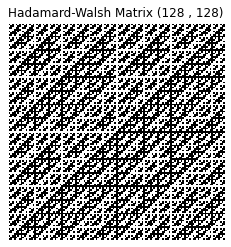

(array([[ 0.08838835,  0.08838835,  0.08838835, ...,  0.08838835,
          0.08838835,  0.08838835],
        [ 0.08838835, -0.08838835,  0.08838835, ..., -0.08838835,
          0.08838835, -0.08838835],
        [ 0.08838835,  0.08838835, -0.08838835, ...,  0.08838835,
         -0.08838835, -0.08838835],
        ...,
        [ 0.08838835, -0.08838835,  0.08838835, ...,  0.08838835,
         -0.08838835,  0.08838835],
        [ 0.08838835,  0.08838835, -0.08838835, ..., -0.08838835,
          0.08838835,  0.08838835],
        [ 0.08838835, -0.08838835, -0.08838835, ...,  0.08838835,
          0.08838835, -0.08838835]]),
 128)

In [6]:
cs1.basis.common.hwtmtx(100)

In the above example, hwtmtx(100) generates a 128x128 matrix. 128 = 2^7

## UDM (uniformly distributed random orthogonal matrix)

Function `rvsmtx()` generates a uniformly distributed random orthogonal matrix. 

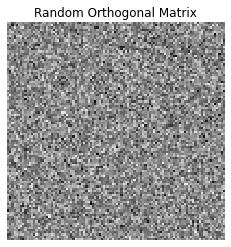

det(RVS_MTX) =  1.0


array([[ 0.07706271,  0.05761245, -0.16396354, ..., -0.04040839,
        -0.11568493, -0.02815972],
       [-0.05248622,  0.03343103, -0.27843806, ..., -0.07267257,
        -0.03009706, -0.0679007 ],
       [ 0.00262602, -0.16307652, -0.00765774, ...,  0.05127652,
        -0.04774639, -0.00535591],
       ...,
       [-0.19438573, -0.17310646, -0.03240117, ..., -0.13324983,
        -0.07490242, -0.01905218],
       [-0.14402965, -0.02417518,  0.11830695, ..., -0.03213843,
         0.09945616,  0.05014907],
       [-0.08287768, -0.04080208, -0.13373785, ...,  0.07091173,
        -0.02029529, -0.0428608 ]])

In [7]:
cs1.basis.common.rvsmtx(100)

## DWT

In [8]:
cs1.basis.common.print_wavelet_families()

haar family: haar
db family: db1, db2, db3, db4, db5, db6, db7, db8, db9, db10, db11, db12, db13, db14, db15, db16, db17, db18, db19, db20, db21, db22, db23, db24, db25, db26, db27, db28, db29, db30, db31, db32, db33, db34, db35, db36, db37, db38
sym family: sym2, sym3, sym4, sym5, sym6, sym7, sym8, sym9, sym10, sym11, sym12, sym13, sym14, sym15, sym16, sym17, sym18, sym19, sym20
coif family: coif1, coif2, coif3, coif4, coif5, coif6, coif7, coif8, coif9, coif10, coif11, coif12, coif13, coif14, coif15, coif16, coif17
bior family: bior1.1, bior1.3, bior1.5, bior2.2, bior2.4, bior2.6, bior2.8, bior3.1, bior3.3, bior3.5, bior3.7, bior3.9, bior4.4, bior5.5, bior6.8
rbio family: rbio1.1, rbio1.3, rbio1.5, rbio2.2, rbio2.4, rbio2.6, rbio2.8, rbio3.1, rbio3.3, rbio3.5, rbio3.7, rbio3.9, rbio4.4, rbio5.5, rbio6.8
dmey family: dmey
gaus family: gaus1, gaus2, gaus3, gaus4, gaus5, gaus6, gaus7, gaus8
mexh family: mexh
morl family: morl
cgau family: cgau1, cgau2, cgau3, cgau4, cgau5, cgau6, cgau7, 

In [9]:
import pywt

w = pywt.Wavelet('db3')
print(w)
print(w.dec_lo, w.dec_hi, w.rec_lo, w.rec_hi) # w.filter_bank

Wavelet db3
  Family name:    Daubechies
  Short name:     db
  Filters length: 6
  Orthogonal:     True
  Biorthogonal:   True
  Symmetry:       asymmetric
  DWT:            True
  CWT:            False
[0.03522629188570953, -0.08544127388202666, -0.13501102001025458, 0.45987750211849154, 0.8068915093110925, 0.33267055295008263] [-0.33267055295008263, 0.8068915093110925, -0.45987750211849154, -0.13501102001025458, 0.08544127388202666, 0.03522629188570953] [0.33267055295008263, 0.8068915093110925, 0.45987750211849154, -0.13501102001025458, -0.08544127388202666, 0.03522629188570953] [0.03522629188570953, 0.08544127388202666, -0.13501102001025458, -0.45987750211849154, 0.8068915093110925, -0.33267055295008263]


In [10]:
w.vanishing_moments_phi, w.vanishing_moments_psi

(0, 3)

消失矩越高，小波函数和越多阶数的原始信号正交，因此得到更多小的小波系数。可以理解为大的小波系数更集中在包含信号频率的小波频段内，遗漏在这些频段之外的小波系数值很小（ frequency leakage），可以忽略，因此对于数据压缩有好处。当然大的消失矩对应长支撑，因此计算量会上升。

### 1D DWT

When running DWT using a specific basis function, the signal is fed through (inner product with) a high pass filter (difference filter) and a low pass filter (smoothing / averaging filter), each of which is unique to the wavelet basis function.

For 'db2', the high/ low pass filtering each has two terms, and occurs with a step size (stride) of 2, therefore, after the filtering is completed, you also get a downsampling by 2 of the original signal. Actual length will depend on the filter length and the signal extension mode. The high pass filtered result gives you the cD coefficients. The low pass filtered result gives you the cA coefficients.

In [11]:
import numpy as np
x = np.random.rand(8)
cA, cD = pywt.dwt(x, 'db3')
x, cA, cD, pywt.idwt(cA, cD, 'db3')

(array([0.78965671, 0.27598639, 0.63999209, 0.11089852, 0.99680015,
        0.96934161, 0.86798272, 0.63766079]),
 array([0.51585713, 1.0040888 , 0.71371049, 0.57822464, 1.40292732,
        0.93162577]),
 array([ 0.20353647,  0.32317047,  0.39582975, -0.06010062, -0.06672695,
         0.05034886]),
 array([0.78965671, 0.27598639, 0.63999209, 0.11089852, 0.99680015,
        0.96934161, 0.86798272, 0.63766079]))

### 2D DWT

#### Implementation I - Using `pywt.dwt`

<pre>

                                                -------------------
                                                |        |        |
                                                | cA(LL) | cH(LH) |
                                                |        |        |
 Wavelet sub-bands:  (cA, (cH, cV, cD))  --->    -------------------
                                                |        |        |
                                                | cV(HL) | cD(HH) |
                                                |        |        |
                                                -------------------
</pre>

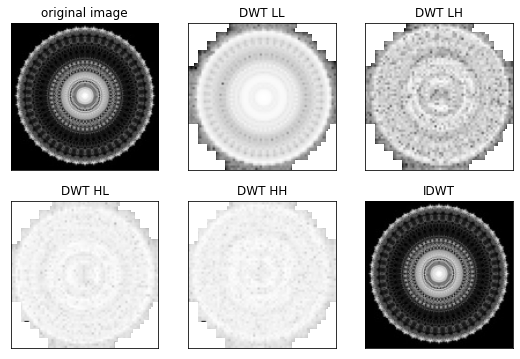

In [12]:
cs1.domain.image.img_dwt('symmetry.jpg', flavor = 1)

#### Implementation II - Using ortho basis matrix 

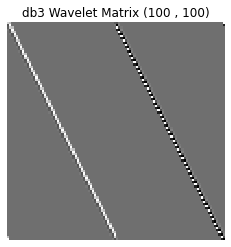

det(DWT_MTX) =  -1.0


In [13]:
_ = cs1.basis.common.dwtmtx(100, display = True)

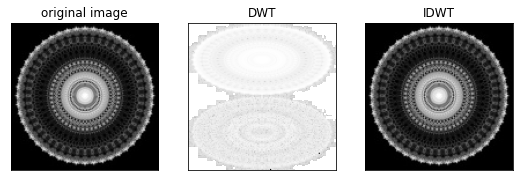

In [14]:
cs1.domain.image.img_dwt('symmetry.jpg', flavor = 2)

### About the length of cA, cD  
If the DWT extension mode is set to periodization, cA and cD is a vector of length ceil(x/2).  
For the other extension modes ('zero', 'constant', 'symmetric', 'reflect', 'periodic', 'smooth'), cA and cD is a vector of length floor((x+lf-1)/2). lf = the length of the decomposition filters

### Lossy Image compression by DCT and DFT

non-zero elements:  357
Compression ratio =  1 %


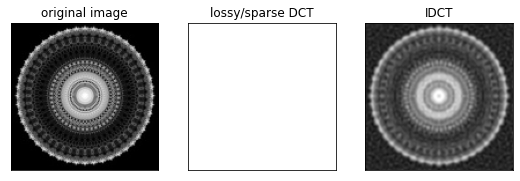

In [15]:
_ = cs1.domain.image.dct_lossy_image_compression('symmetry.jpg', percent = 99)

non-zero elements:  332
Compression ratio =  1 %


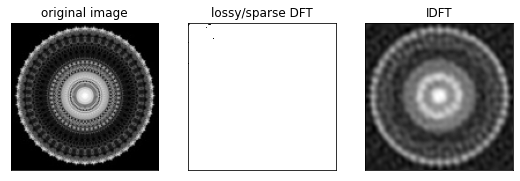

In [16]:
_ = cs1.domain.image.dft_lossy_image_compression('symmetry.jpg', percent = 99)

# Compressed Sensing

The compression matrix and the basis you are doing the sparse reconstruction in are coherent since they are both constructed from the DCT matrix. Do the sparse reconstruction in the DCT basis since the image will sparse/compressible in that basis. For the compression matrix, you need to choose something that will not correlate with the DCT matrix. Noiselets, Random Gaussian will work well. You might try JL-Lemma type matrices as well though I never found them to be very reliable.   

# 2D Signal (unfold image as 1D)

#### 信号采样，发送端处理

In [17]:
from cs1 import cs

imgdata, w, h = cs1.domain.image.get_img_data('./symmetry.jpg')
y, r = cs1.cs.Sensing(imgdata, 0.1)

#### 信号复原，接收端处理

In [18]:
A = cs.MeasurementMatrix (len(imgdata), r)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.7min finished


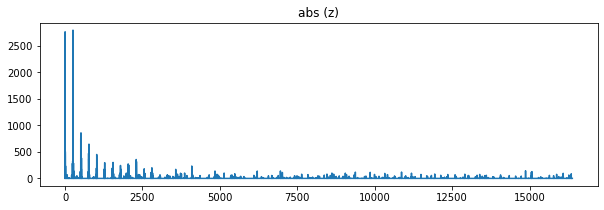

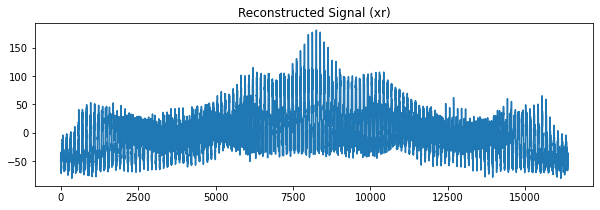

In [19]:
z,xr = cs.Recovery (A, y)

Text(0.5, 1.0, 'recovered image')

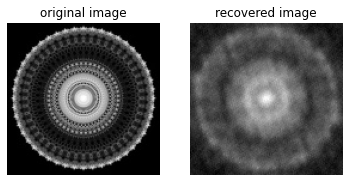

In [20]:
import matplotlib.pyplot as plt

img_r = xr.reshape((w,h))

fig = plt.figure(figsize=(6,3))
ax = fig.add_subplot(121)
ax.imshow(imgdata.reshape((w,h)), 'gray')
ax.axis('off')
ax.set_title('original image')

ax = fig.add_subplot(122)
ax.imshow(img_r, 'gray')
ax.axis('off')
ax.set_title('recovered image')

本例中，展平了2d数据，只需要传送y，r，以及图像尺寸(w,h)。
压缩率 = 20%

### Sample Image 2

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   21.5s finished


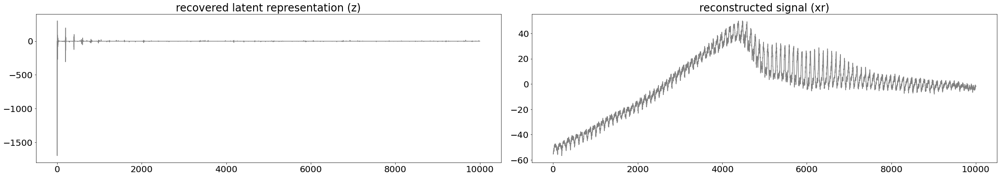

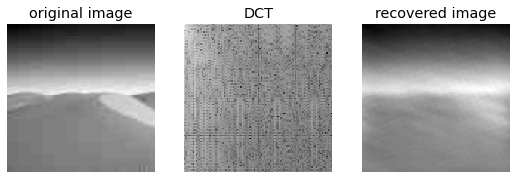

The time (s) of execution of above program is : 22.52391290664673


In [21]:
import time

start = time.time()
_ = cs1.domain.image.Image_Sensing_n_Recovery('desert.jpg', k = 0.1) # this function combines all the above
end = time.time()

print("The time (s) of execution of above program is :", end-start)

# 1D signal

Determine Hyperparameter $\Psi$  

Test against all bases.  Get $\mu$ and r

# Example 1 - Raman

## Adaptive compressed sensing of Raman spectroscopic profiling data for discrimitive tasks

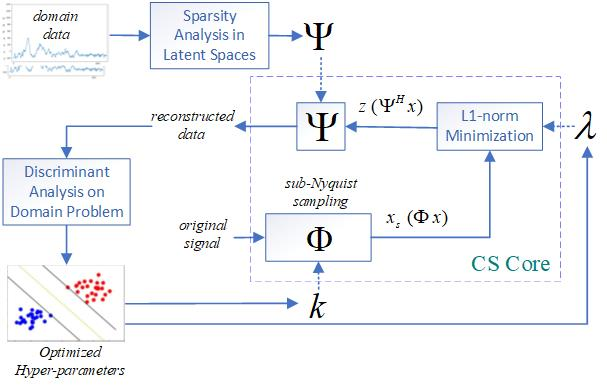



In [1]:
!pip install qsi-tk

## Load Data

load dataset from 7341_C2.csv
X.shape (32, 2090)  y.shape (32,)


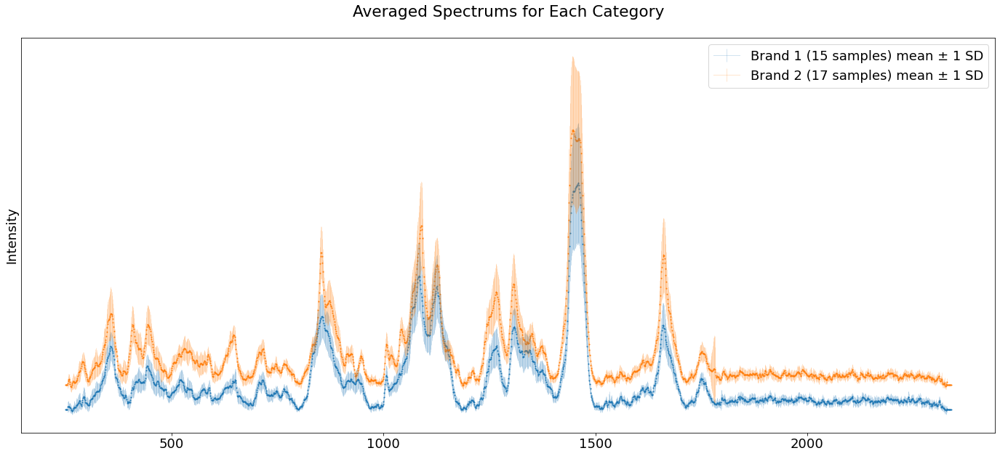

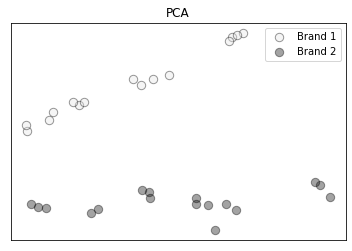

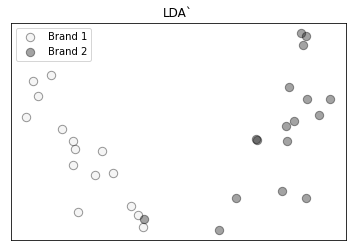

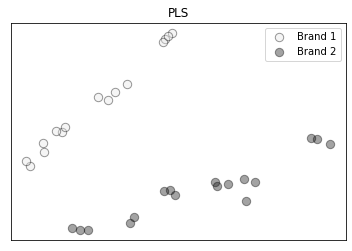

7341_C2.txt - The data set in CSV (comma separated value) format.

* Data Source: Stage 4 (4-C7 years) formula milk powder
* Procedures: Take a proper amount of milk powder into a separate small hole in the 96-well plate. Then, the sample is directly irradiated by a laser Raman spectrometer. The laser power is 250mW, 350mW, 450mW, the integration time is 50s, the spectrum range is 250~2 339cm-1, and the spectral resolution is 1cm-1.

The first column is 'label'. Value is either 1 (1st Brand) or 2 (2nd Brand). The rest 2090 columns are the Raman wavenumbers. Each row is a sample. This data set is typically used for brand classification. 
--------------------
If you use this data set, please add the reference: 
[1] Adaptive compressed sensing of Raman spectroscopic profiling data for discriminative tasks [J]. Talanta, 2020, doi: 10.1016/j.talanta.2019.120681


In [1]:
from qsi import io
X, y, X_names, _, labels = io.load_dataset('s4_formula_c2')

The two classes have a wide dividing area. After CS, we want to keep this discriminative structure between the two classes.

## Basis Matrix  $\Psi$  

$\Psi$ is a `unitary matrix`. i.e. its conjugate transpose is also its inverse, or $\Psi^H = \Psi^{-1}$  
For real matrices, unitary is the same as `orthogonal`.

Use 5 candidate basis matrices: IDM (Identity matrix), DCT ( discrete cosine transform), DFT (which is widely used in medical imaging), HWT (Hadamard-Walsh transform, which is widely used in signal processing), UDM (uniformly distributed random orthogonal matrix)  

IDM doesn't transform into other spaces. It is just for theoretical purpose.  

## Generate non-adaptive $\Psi$, and save to pkl file.   
Next time we can just deserialize the pkl file to load back.

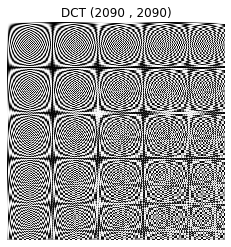

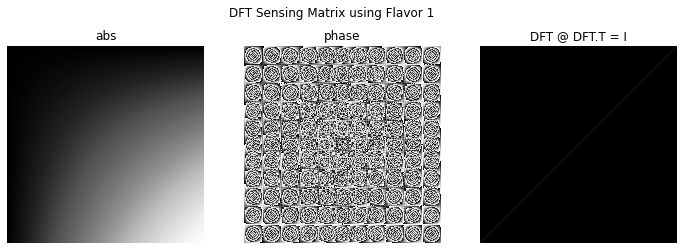

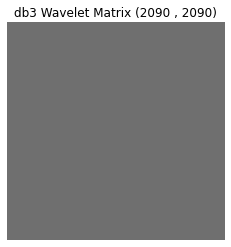

det(DWT_MTX) =  -1.0
Expanded to  4096 , Divide by 64.0
det(HWT_MTX) = 1.0


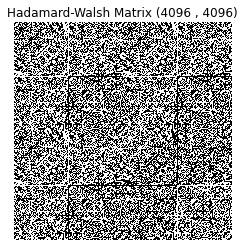

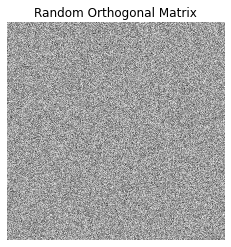

det(RVS_MTX) =  1.0
saved to PSIs_2090.pkl


In [3]:
import cs1

n = X.shape[1]
cs1.basis.common.Generate_PSIs(n, savepath = 'PSIs_' + str(n) + '.pkl')

In [2]:
# Load PSIs back from pickle
import pickle

n = X.shape[1]
file = open('PSIs_' + str(n) + '.pkl','rb')
PSIs = pickle.load(file)
file.close()

## Generate adaptive $\Psi$, i.e., LDA and EBP

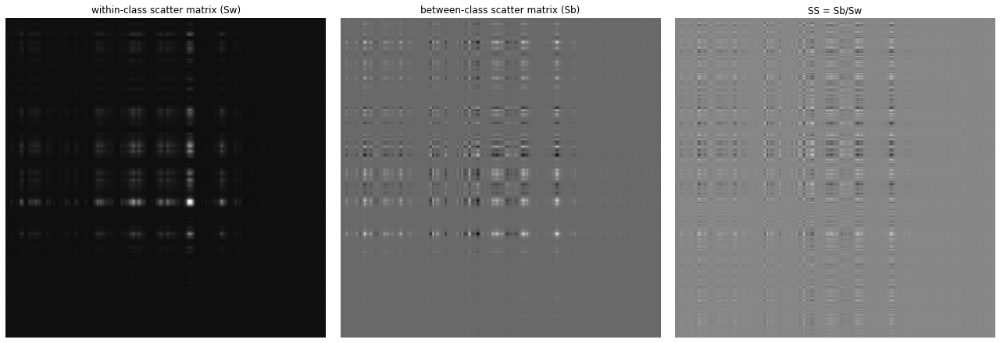

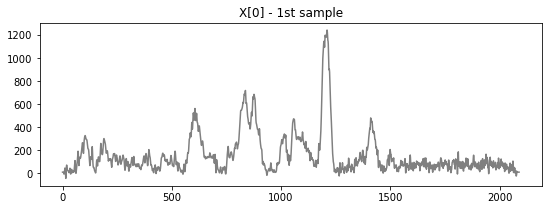

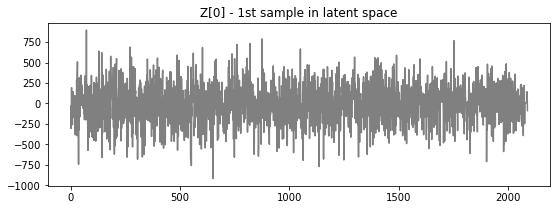

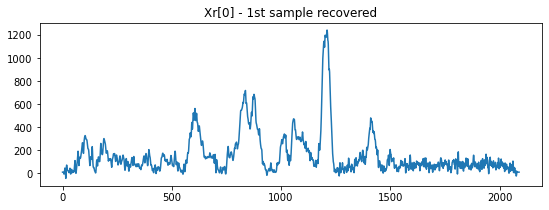

In [5]:
PSIs['LDA'], _, _ = cs1.basis.adaptive.LDA(X[1:], y[1:], display = True)

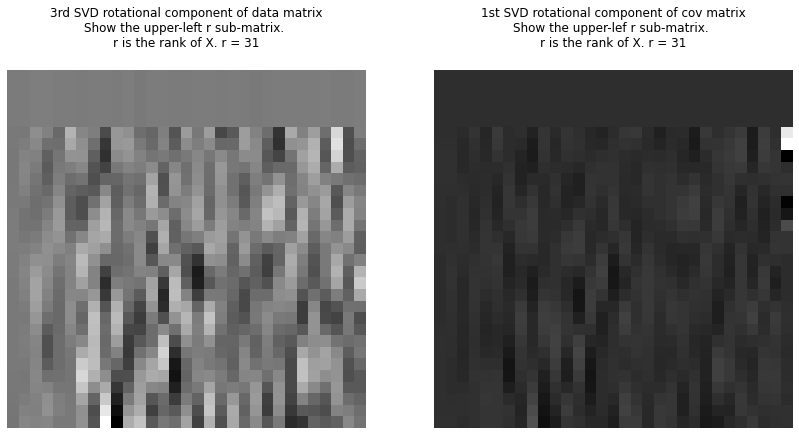

In [6]:
PSIs['EBP'], _ =  cs1.basis.adaptive.EBP(X[1:], display = True)

## Incoherence

We plot the MC curve of db3 wavelet base. MC of DWT is abou $0.8  \sqrt{n}$

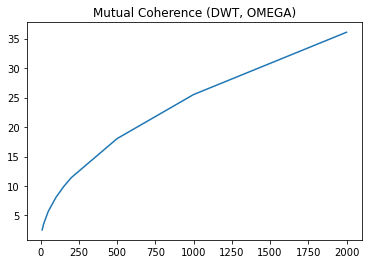

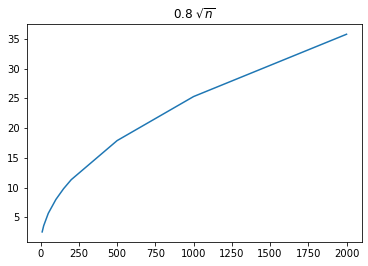

In [7]:
import cs1.basis.common
cs1.basis.common.DwtMcCurve()

All the other non-adaptive bases have theoretical MC values. The run result matches the theoretic calculation.  

### Coherence Between Two Bases  

$\mu(A,B) = \sqrt{n} \underset{0 \leq i,j<n} {max}(a_i^Tb_j) $
a and b are column vectors in A and B  
$ 0 \leq \mu(A,B) \leq \sqrt{n} $  

We are interested in bases pairs with small coherence and in that case we say the two bases are
incoherent. In the case of dictionaries for sparse representation, the incoherence is important because
a small μ means small correlation between the two bases, thus a dictionary composed by such a
pair of bases has a “richer vocabulary” relative to a dictionary with a larger μ .  
CS requires a small μ between $\Psi$ and $\Omega$. $\Omega$ is a scrambled identity matrix. The sensing matrix $\Phi$ is a subset off $\Omega$ (take the first few rows).  

Theoretical computation results: 

> μ($\Omega$, I) = $\sqrt n$. $\sqrt{n}$ is the theoretical upper bound of $\mu$   
> μ($\Omega$, C) = $\sqrt 2$   
> μ($\Omega$, F) = 1  
> μ($\Omega$, H) = 1  
> μ($\Omega$, O) = $\sqrt{2 log(n)}$

$ I = IDM, C = DCT, F = DFT, H = HWT, O = Random Orthogonal Matrix $ 

In [8]:
import math
n = X.shape[1]
math.sqrt(2*math.log(n, math.e))

3.910222332542961

$ z = \Psi^H x $

## Sparsity analysis 

$ z = \Psi^H x $  
We will transform the original x into the latent space defined by various $\Psi$.  
CS requires to choose the $\Psi$ that results in the highest sparsity.

### Discussion: There lacks a concensus on the sparsity measure. 

We can usually use :  Lp-norm(0<=p<1)  or  the Gini index as such a measure.

"Is there any exact, i.e. numerical, definition for sparsity?" And by numerical, I understand both computable, and practically "usable". My take is that: not yet, as least, there is no consensus, yet there are some worthy contenders. The first option "count only non zero terms" is precise, but inefficient (sensitive to numerical approximation and noise, and very complex to optimize). The second option "most elements of a signal are zero or close to zero" is rather imprecise, either on "most" and "close to".

So "an exact measure of sparsity" remains elusive, without more formal aspects. One recent attempt to define sparsity performed in Hurley and Rickard, 2009 Comparing Measures of Sparsity, IEEE Transactions on Information Theory.

Their idea is to provide a set of axioms that a good sparsity measure ought to fulfill; for instance, a signal x
multiplied by a non zero constant, αx, should have the same sparsity. In other terms, a sparsity measure should be 0-homogeneous. Funnily, the ℓ1 proxy in compressive sensing, or in lasso regression is 1-homogeneous. This is indeed the case for every norm or quasi-norm ℓp, even if they tend to the (non-robust) count measure ℓ0 as p→0
.

So they detail their six axioms, performed computations, borrowed from wealth analysis:

    Robin Hood (take from the rich, give to the poor reduces sparsity),
    Scaling (constant multiplication preserves sparsity),
    Rising Tide (adding the same non zero account reduces sparsity),
    Cloning (duplicating data preserves sparsity),
    Bill Gates (One man getting richer increases sparsity),
    Babies (adding zero values increases sparsity)

and probe known measures against them, revealing that the Gini index and some norm or quasi-norm ratios could be good candidates

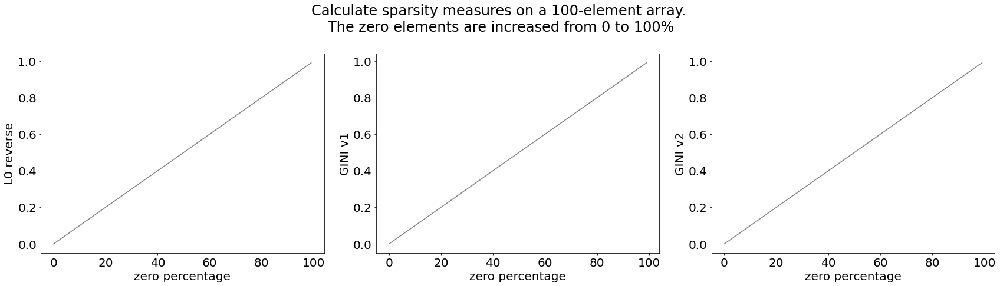

In [9]:
import cs1.metrics

cs1.metrics.compare_sparsity_flavors()

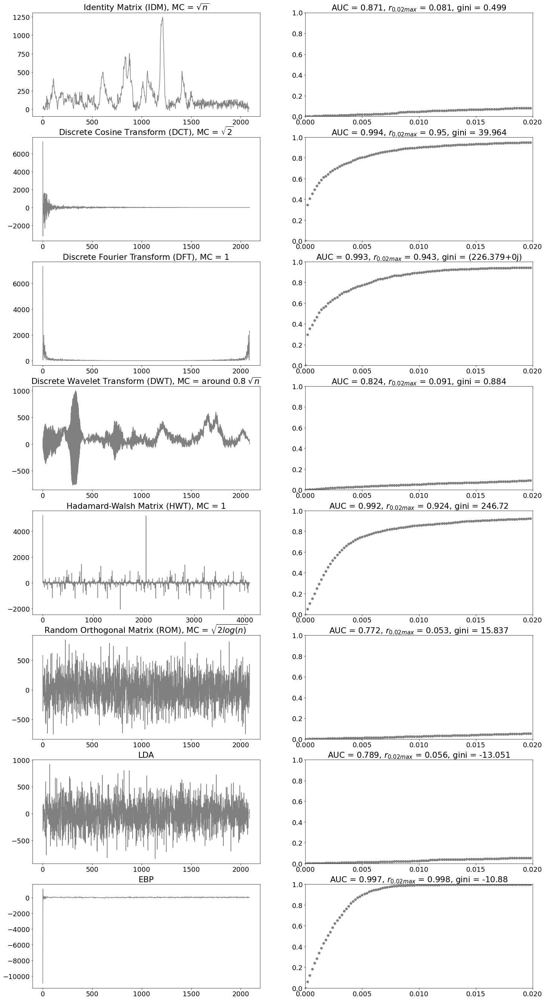

In [10]:
import cs1.metrics

cs1.metrics.analyze_sparsity(X[0], PSIs)

AUC best:  DFT  DCT  
$\mu$ best: DFT HWT

Choose DFT   
Under DFT, at the 0.02 max abs threshold, non-sparsity degree r ≈ 1 - 0.95 = 0.05 (almost equal).  According to the 
"four-to-one practical / empirical rule": for exact reconstruction, one needs about four incoherent measurements per unknown nonzero term  

k >= 4 r (r is number of non-zeros in the signal, 1 - degree of sparsity)  
k >= 0.2


## Sensing Matrix for sub-Nyquist sampling

### batch process by vectorization

### single-sample processing

In [11]:
from cs1 import cs

xs, r = cs.Sensing(X[0], 0.2)

From the original 2090-point signal, only sample k percentage

## Measuring Matrix $A = \Phi \Psi$

can also use the following to get the measuring matrix A

In [12]:
A = cs.MeasurementMatrix (len(X[0]), r)

## Reason for using L1 minimization:  
L0-minimization is nonconvex and NP-hard; L1-minimization is convex and easier to get global solution.  
The non-convex L0-minimization can be approximated by the L1-relaxation. Relaxation means to remove certain constraint of each variable. 


## Solver 1: LASSO - L1 Minimization & Reconstruction

Let $A = \Phi \Psi$, 

$ 
x_s = Az
$


$
A = [a_1, a_2, ..., a_n]
$

Each $a$ is column vector / atom / dictionary entry, 

Because A has more columns than rows, A is `overcomplete`. That means A has excessive dictionary entries (non-repetive), and can express data with high sparsity.

A is also `full row rank`, i.e. rank(A) = r (row number)   

The equations specified by $ x_s=Az$ has many (not unique) solutions. This is an `underdetermined linear system` that has more unknowns than equations.  
The solutions can be represented as $z = A^T (AA^T)^{-1}x_s + V[r:,:] v $, $A = USV^T $, $v$ is a freely chosen (n-r) × 1 vector .  

We can find the sparsist solution by minimize L1-norm or $||z||_1$. We don't use L0-norm because minimizing it is `NP hard`. 

> objective: minimize ||z||   
> subject to: $ x_s=Az$ 

## Solver 2: Orthogonal Matching Pursuit

OMP algorithm for approximating the fit of a linear model with constraints imposed on the number of non-zero coefficients (ie. the pseudo-L0 norm).

Being a forward feature selection method like Least Angle Regression, orthogonal matching pursuit can approximate the optimum solution vector with a fixed number of non-zero elements.

OMP is based on a greedy algorithm that includes at each step the atom (a column in the measurement matrix A) most highly correlated with y or the current residual. It is similar to the simpler matching pursuit (MP) method, but better in that at each iteration, the residual is recomputed using an orthogonal projection on the space of the previously chosen dictionary elements. After k iterations, the coefficents of the selected column vectors form the reconstructed sparse signal z.  

OMP's derivaties: Compressive Sampling Matching Pursuit (CoSaMP) and Quantized Compressive Sampling Matching Pursuit (QCoSaMP)

Since OMP is a geedy algorithm based on L0, its reconstruction result could be different from LASSO that relies on L1.

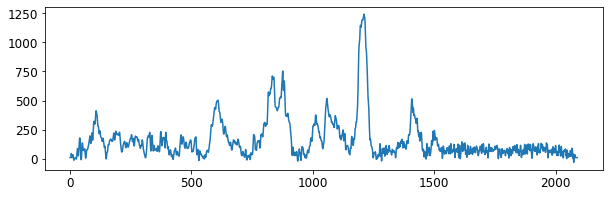

In [13]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10,3))
plt.plot(X[0])

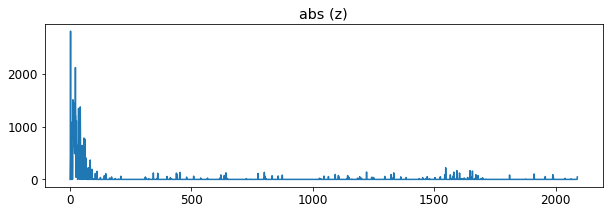

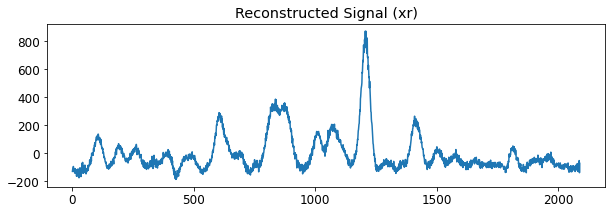

In [14]:
z,xr = cs.Recovery (A, xs, solver = 'LASSO')

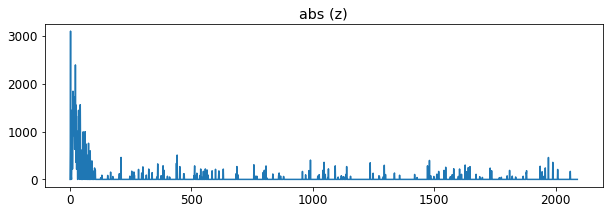

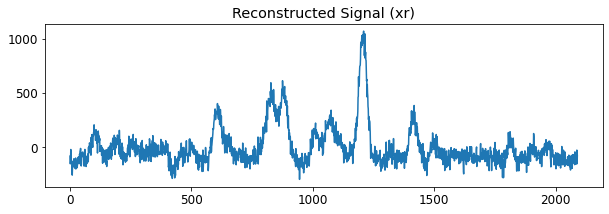

In [15]:
z,xr = cs.Recovery (A, xs, solver = 'OMP')

通过调节LASSO的L1，使得求解得到的z和OMP具有相同的稀疏度，然后比较重建效果，

## Let us put them together

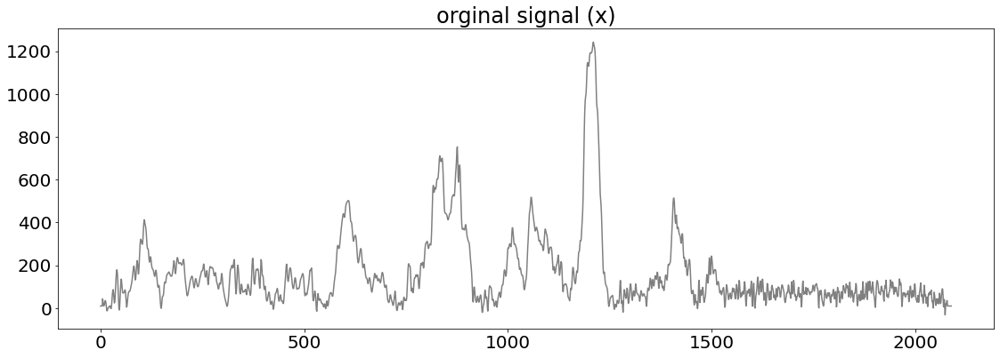

===== k = 0.1  ======


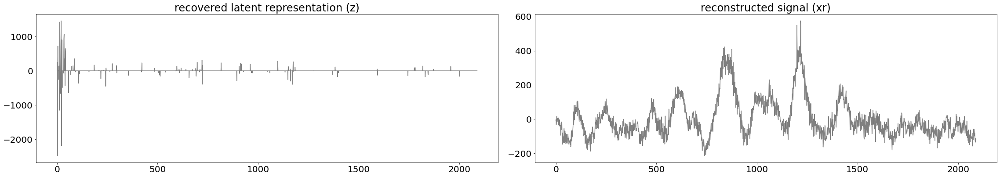

===== k = 0.3  ======


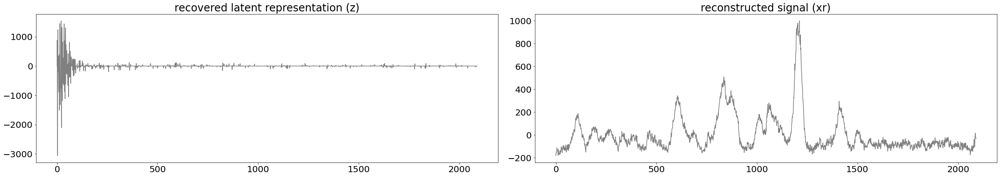

===== k = 1.1  ======


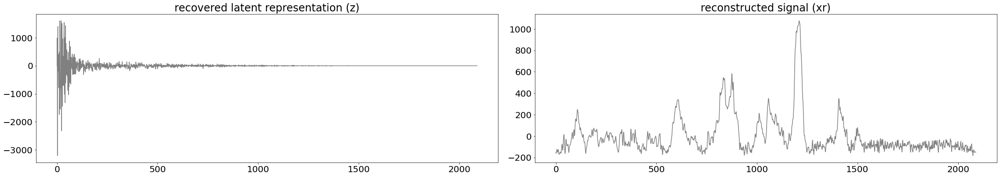

In [16]:
x = X[0]

import matplotlib
matplotlib.rcParams.update({'font.size': 20})
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,6))

ax.plot(x, color = 'gray')
ax.set_title('orginal signal (x)')

fig.tight_layout()
plt.show()

matplotlib.rcParams.update({'font.size': 12}) 

for k in [0.1, 0.3, 1.1]:
        print('===== k =', k, ' ======')
        z, xr = cs.Sensing_n_Recovery (x, k = k, t='DCT')        

NOTE:  

`fig, axs = plt.subplots(3)`

returns a 1D array of subplots.

`fig, axs = plt.subplots(3, 2)`

returns a 2D array of subplots.



===== Ψ = DCT, k =0.1 ======

Sample 1


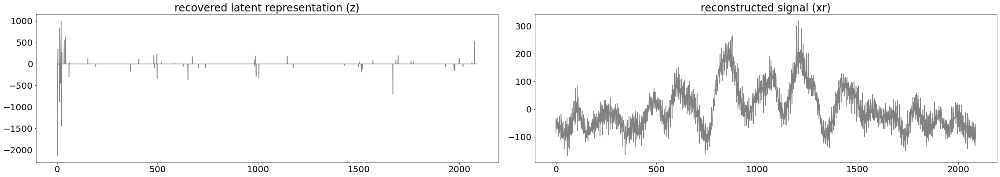

Sample 2


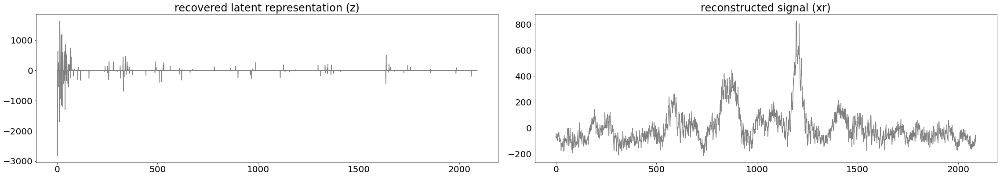

Sample 3


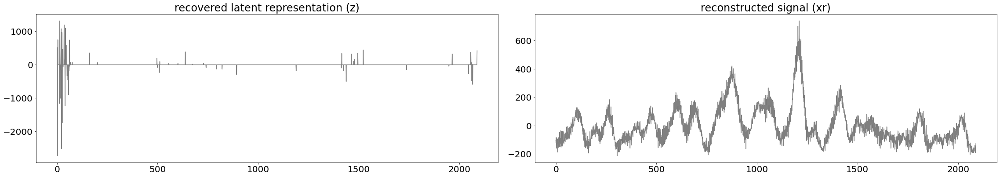

Sample 4


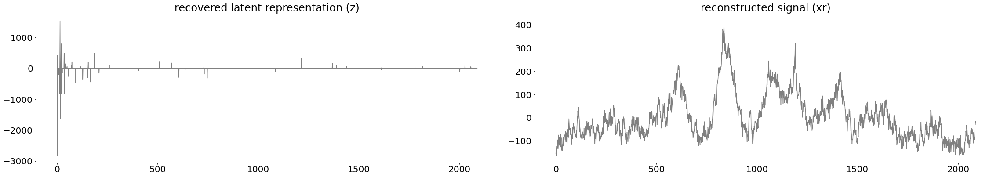

Sample 5


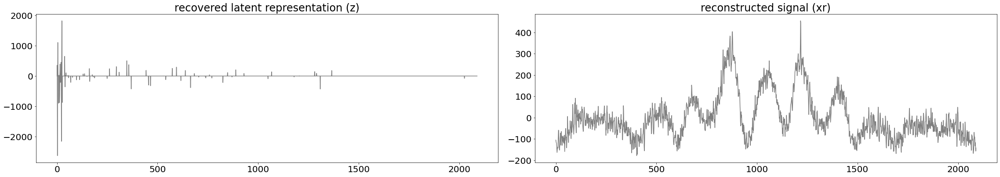

Sample 6


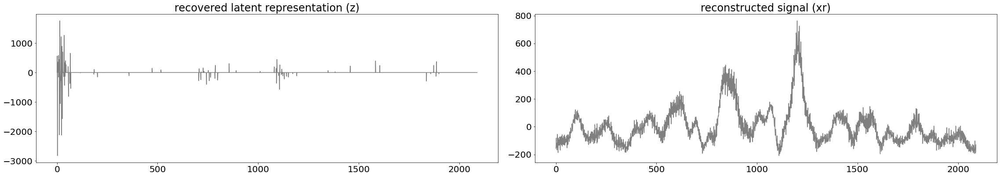

Sample 7


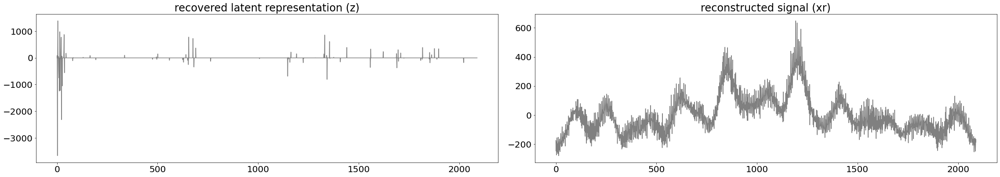

Sample 8


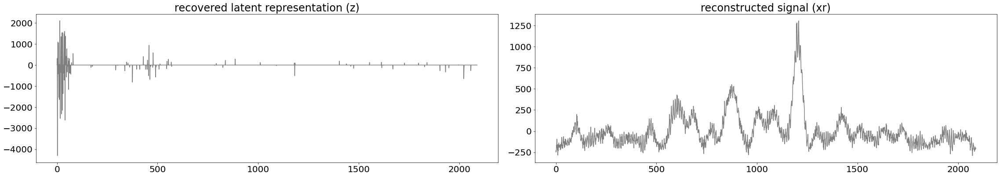

Sample 9


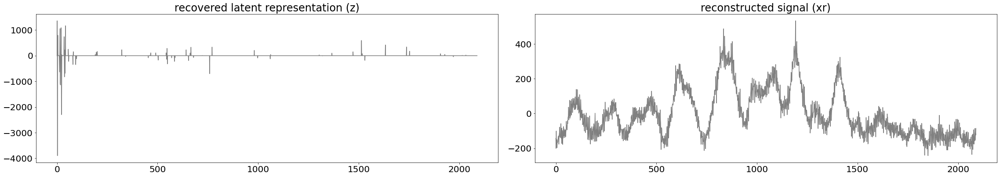

Sample 10


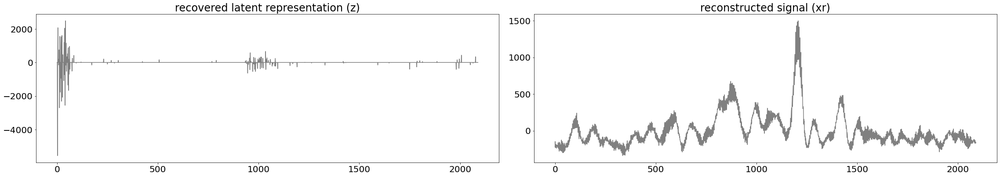

Sample 11


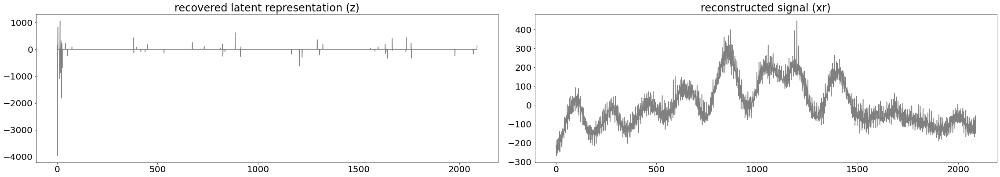

Sample 12


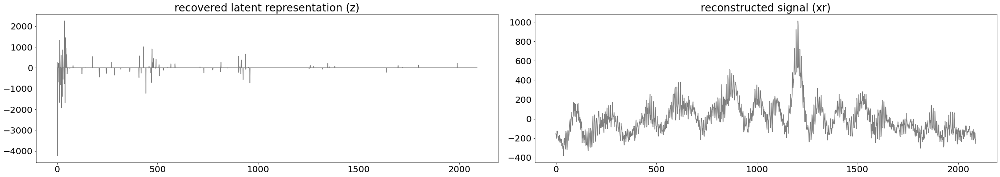

Sample 13


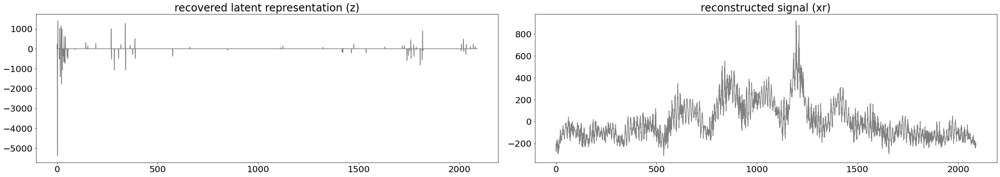

Sample 14


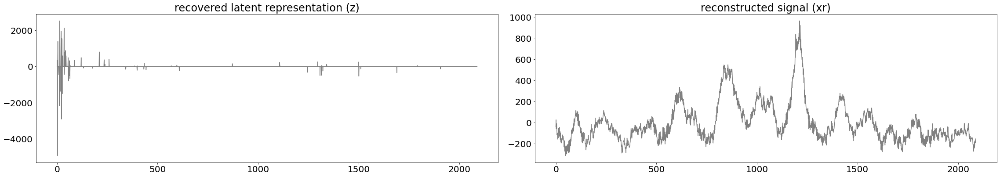

Sample 15


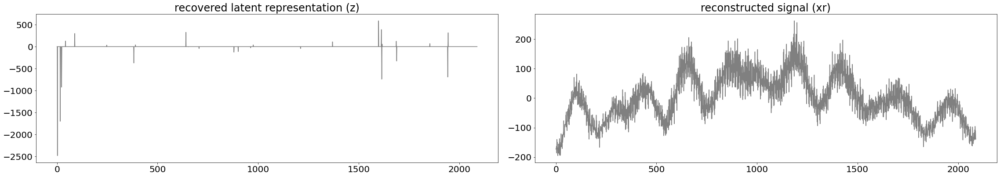

Sample 16


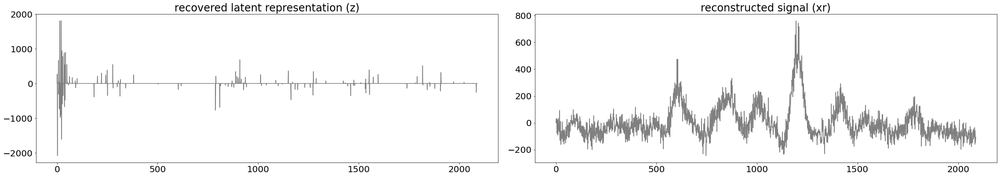

Sample 17


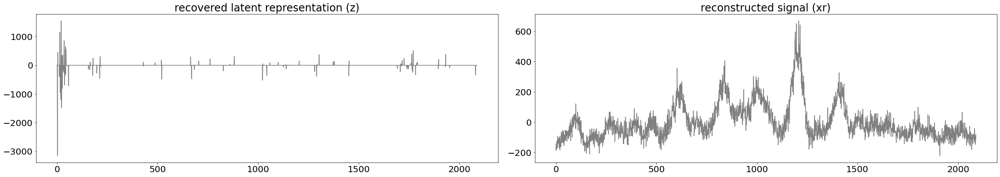

Sample 18


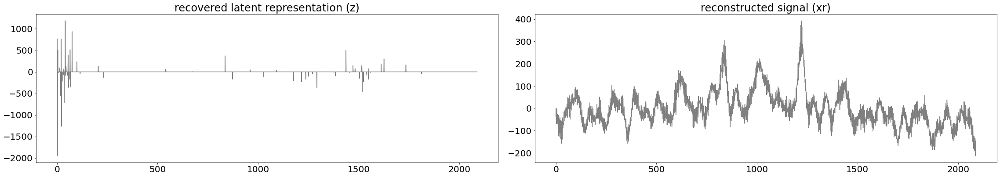

Sample 19


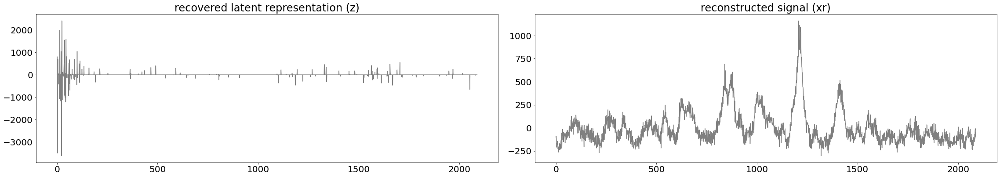

Sample 20


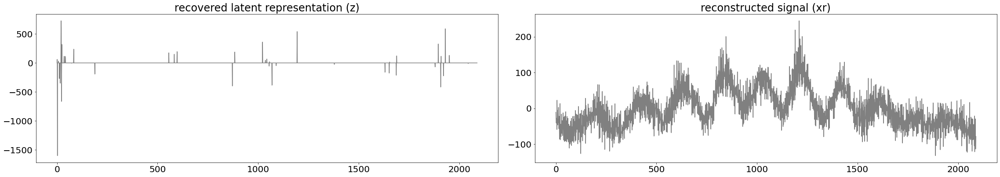

Sample 21


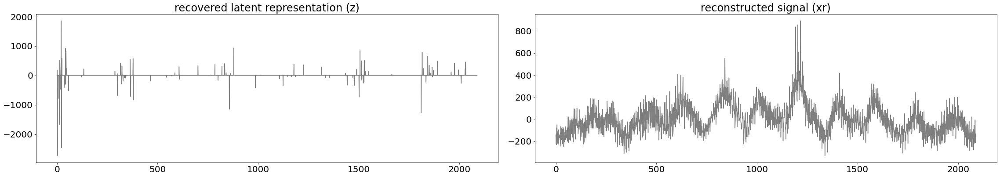

Sample 22


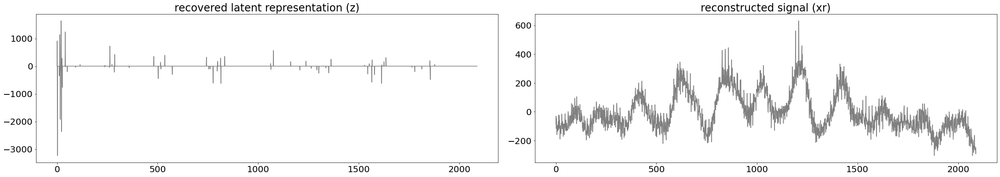

Sample 23


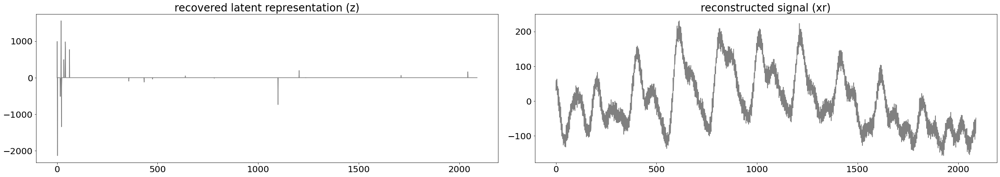

Sample 24


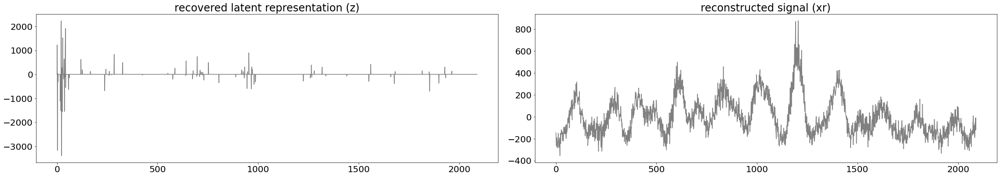

Sample 25


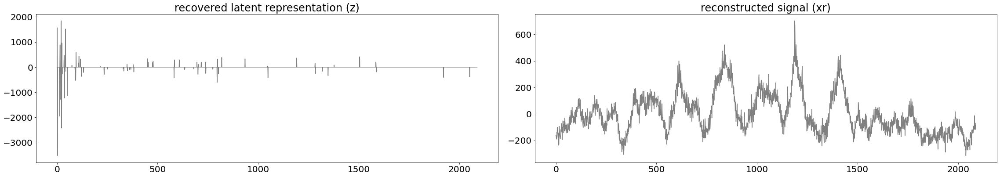

Sample 26


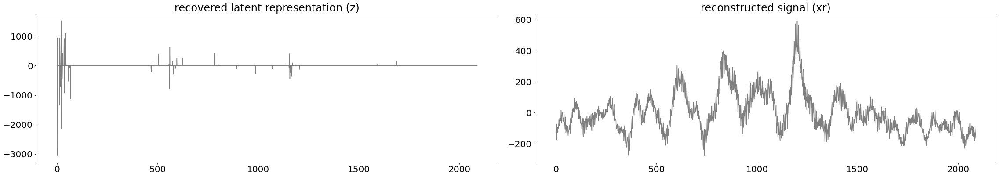

Sample 27


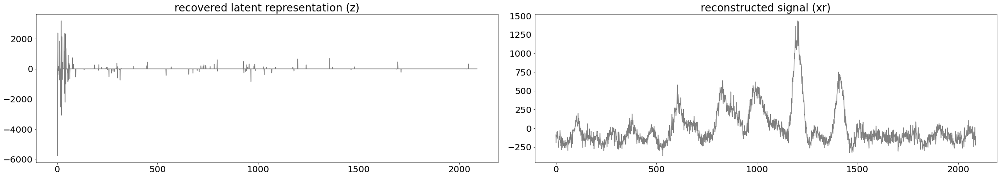

Sample 28


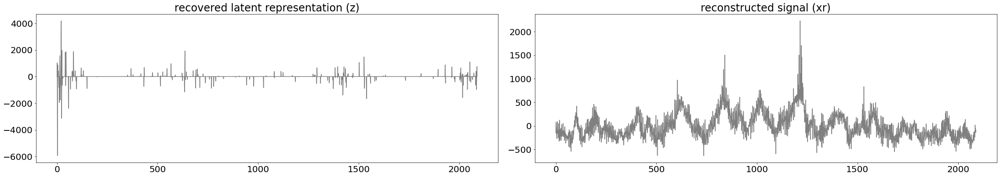

Sample 29


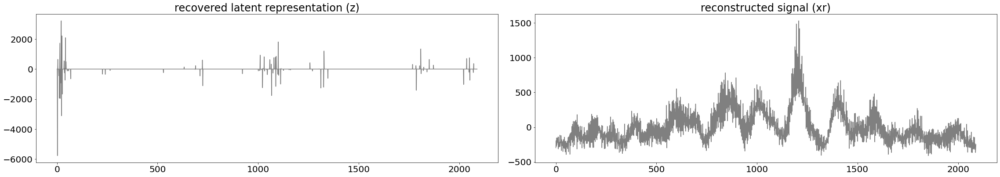

Sample 30


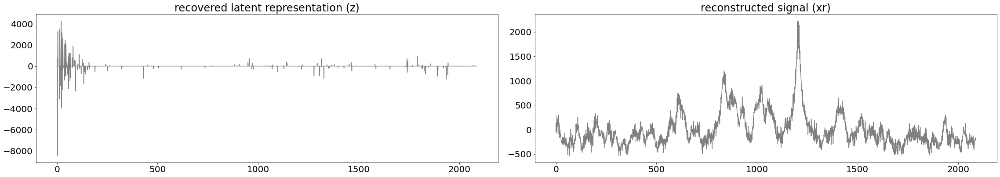

Sample 31


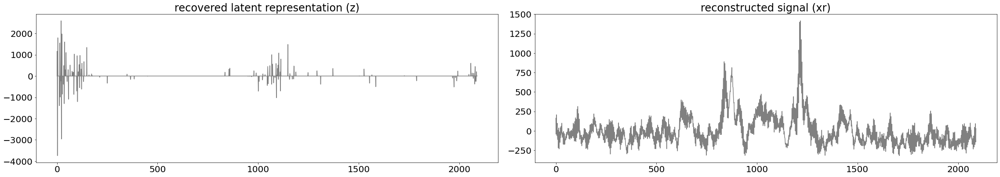

Sample 32


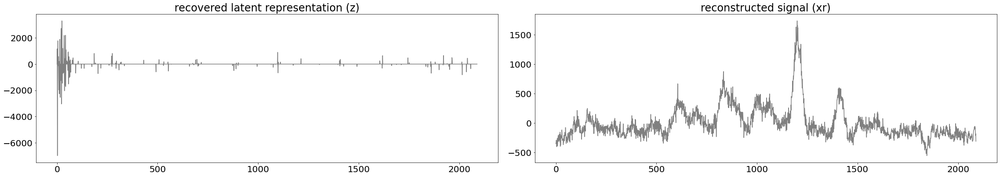

f=1.5279115661606153,p=0.22601732276409042
f=4.189867706277479,p=0.04951351237094259
['PC1', 'PC2']
['Intercept', 'y']
                 Multivariate linear model
                                                            
------------------------------------------------------------
       Intercept        Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.9012 2.0000 29.0000  1.5890 0.2214
         Pillai's trace 0.0988 2.0000 29.0000  1.5890 0.2214
 Hotelling-Lawley trace 0.1096 2.0000 29.0000  1.5890 0.2214
    Roy's greatest root 0.1096 2.0000 29.0000  1.5890 0.2214
------------------------------------------------------------
                                                            
------------------------------------------------------------
           y            Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.8290 2.0000 29.0000

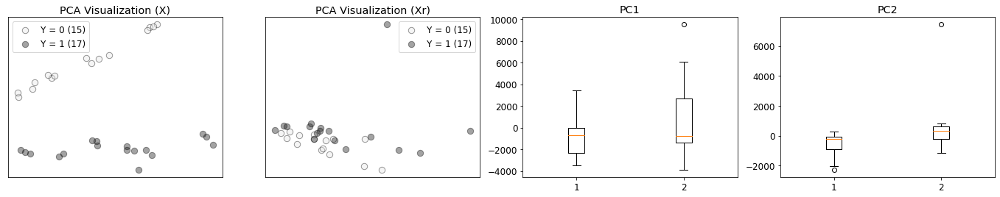


 ------ Class-wise Multivarate KLD on 2 PCA components -----
Multivarate KLD between the orignal and reconstructed signals ( y = 0):  16.747
Multivarate KLD between the orignal and reconstructed signals ( y = 1):  2.107

 ------ Class-wise Multivarate KLD on LDA component -----
KLD between the orignal and reconstructed signals ( y = 1):  0.027


===== Ψ = DCT, k =0.2 ======

Sample 1


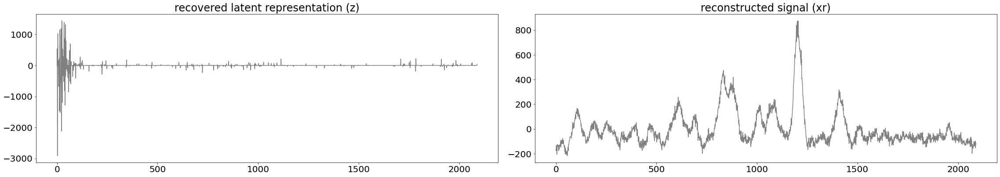

Sample 2


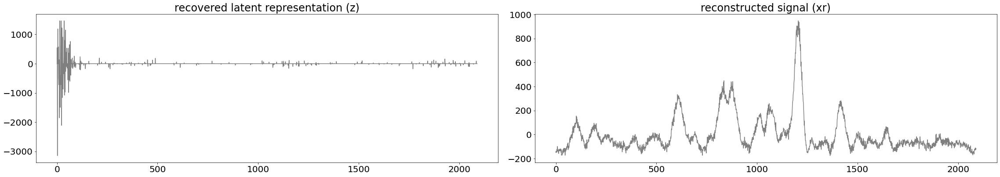

Sample 3


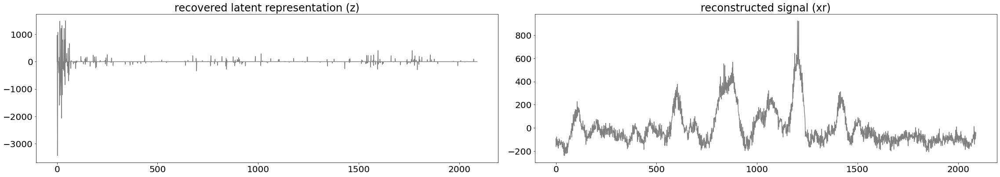

Sample 4


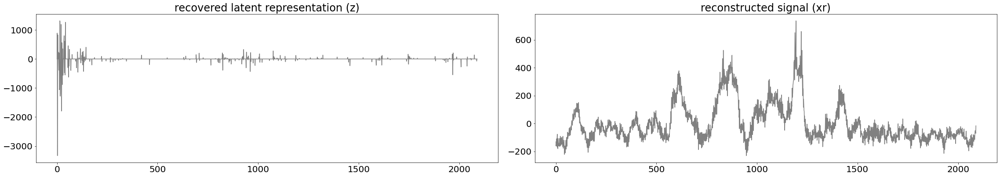

Sample 5


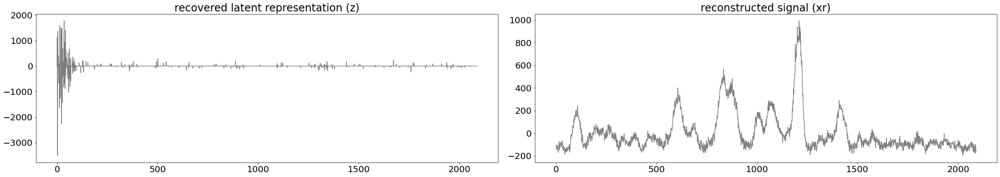

Sample 6


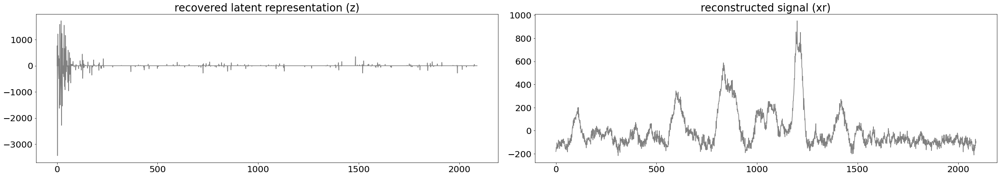

Sample 7


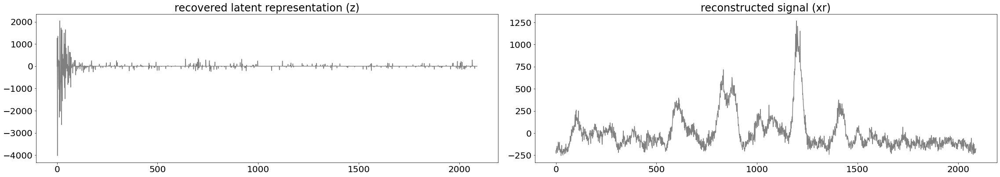

Sample 8


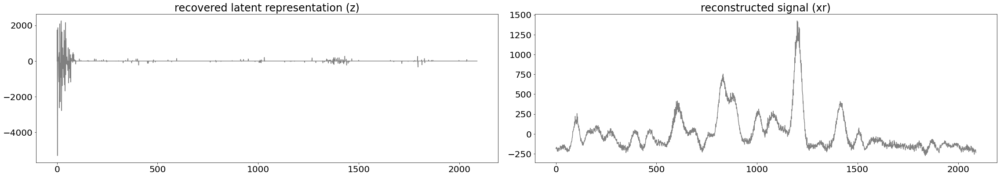

Sample 9


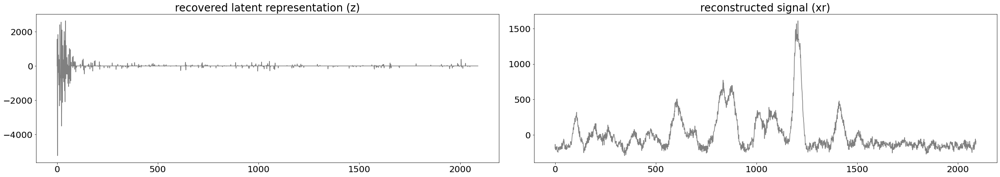

Sample 10


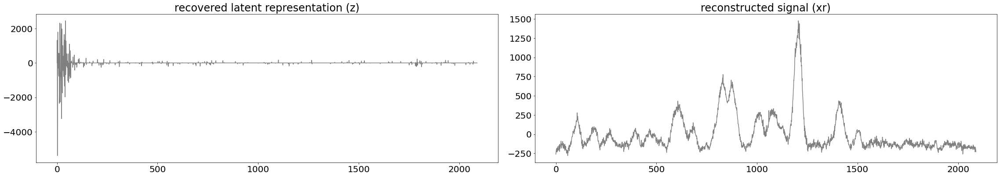

Sample 11


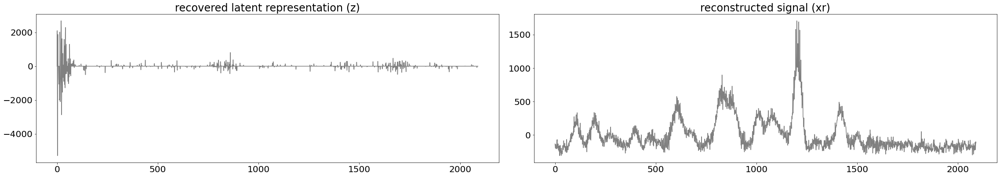

Sample 12


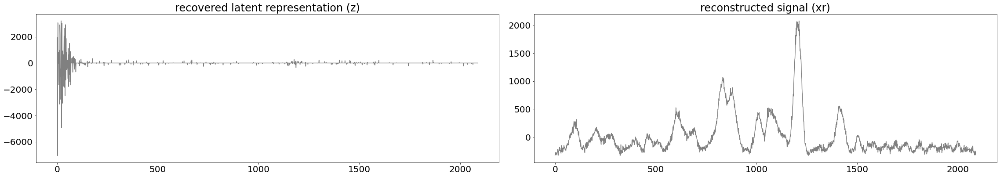

Sample 13


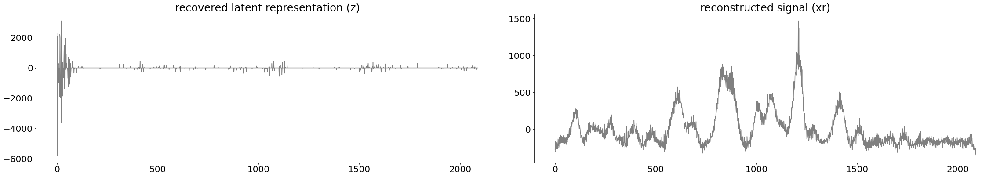

Sample 14


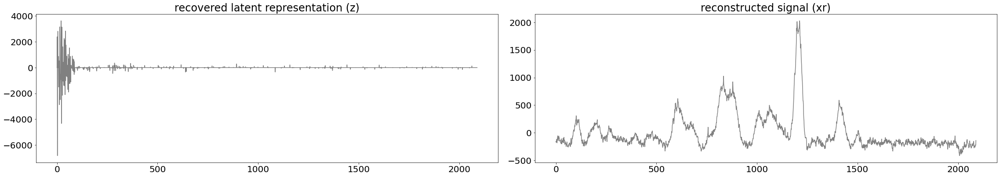

Sample 15


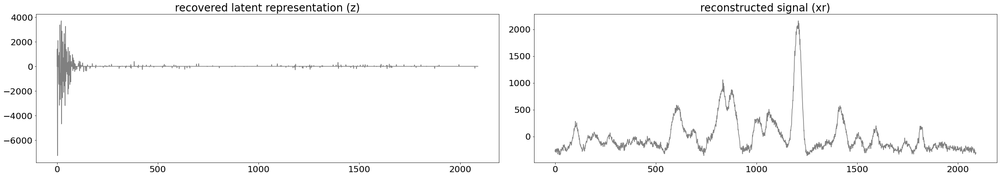

Sample 16


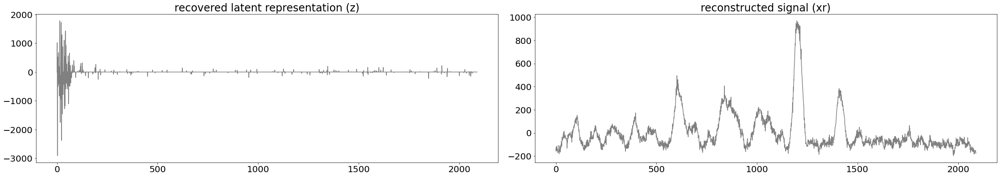

Sample 17


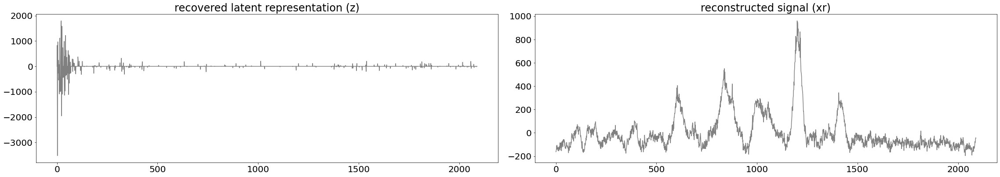

Sample 18


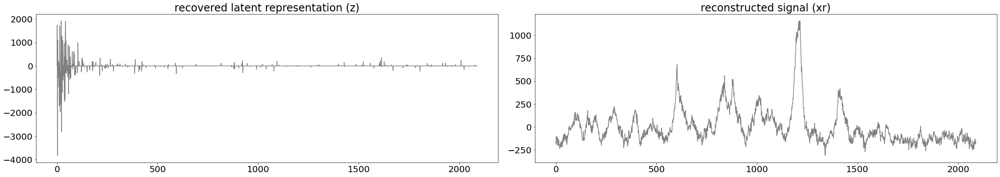

Sample 19


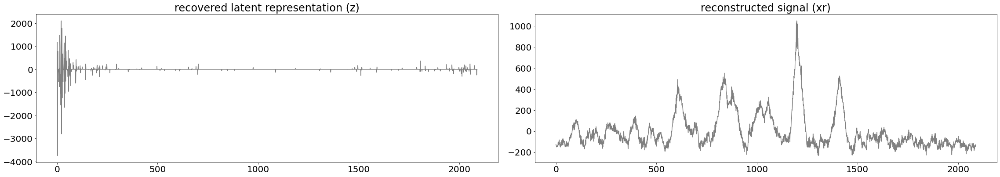

Sample 20


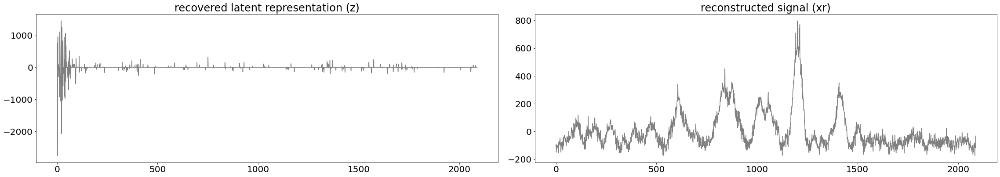

Sample 21


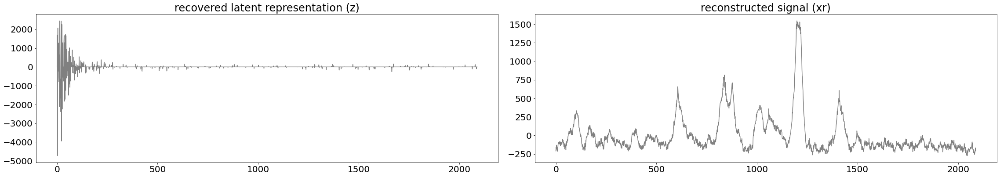

Sample 22


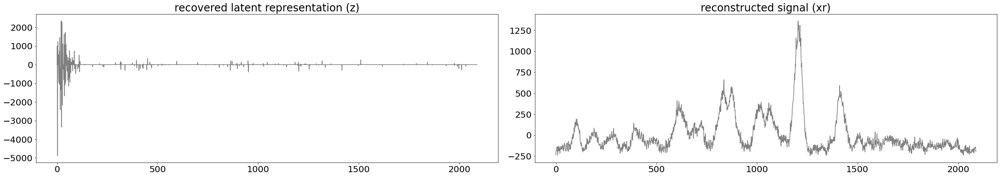

Sample 23


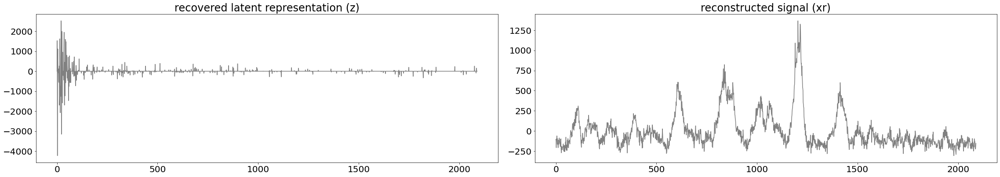

Sample 24


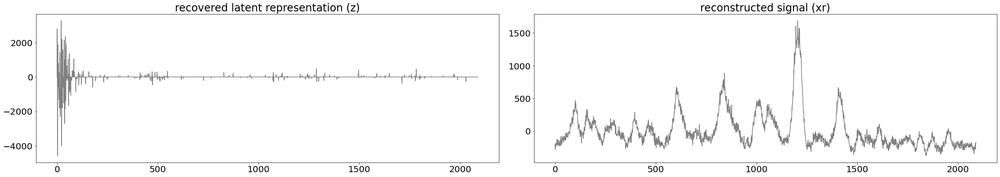

Sample 25


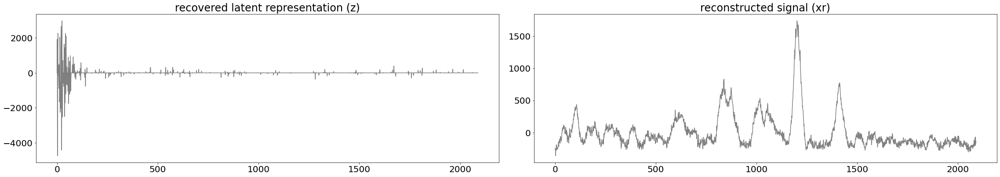

Sample 26


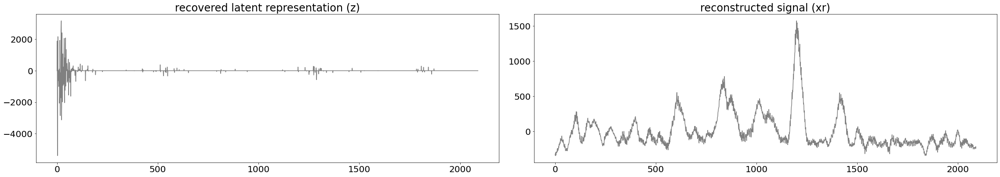

Sample 27


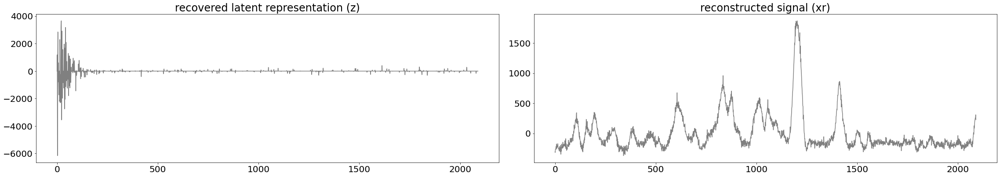

Sample 28


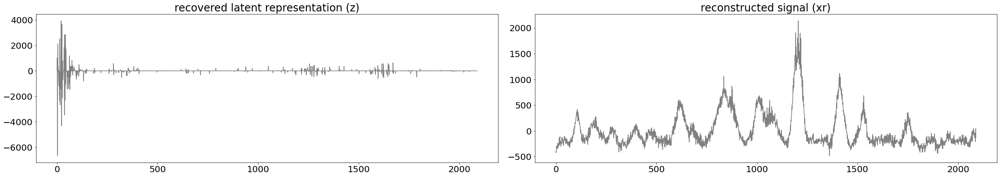

Sample 29


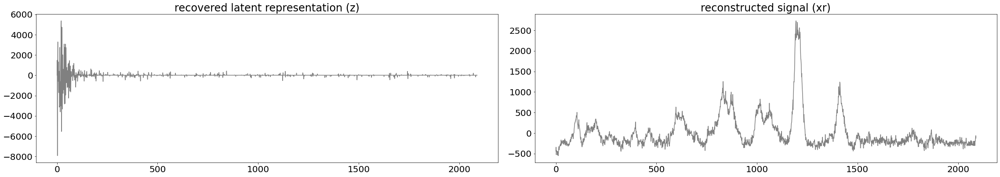

Sample 30


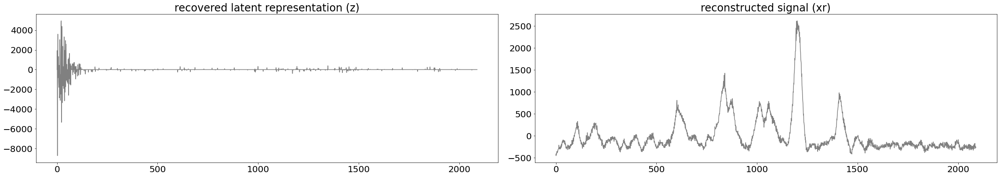

Sample 31


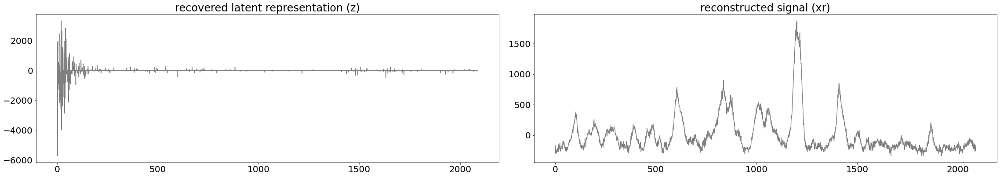

Sample 32


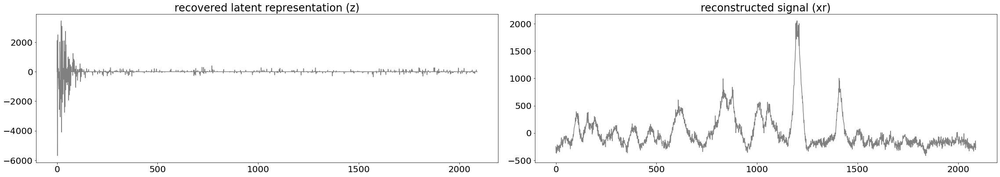

f=2.238430982287131,p=0.14506462582813812
f=85.75101737907394,p=2.6559353962644995e-10
['PC1', 'PC2']
['Intercept', 'y']
                 Multivariate linear model
                                                            
------------------------------------------------------------
       Intercept        Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.3059 2.0000 29.0000 32.8945 0.0000
         Pillai's trace 0.6941 2.0000 29.0000 32.8945 0.0000
 Hotelling-Lawley trace 2.2686 2.0000 29.0000 32.8945 0.0000
    Roy's greatest root 2.2686 2.0000 29.0000 32.8945 0.0000
------------------------------------------------------------
                                                            
------------------------------------------------------------
           y            Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.1897 2.0000 29.00

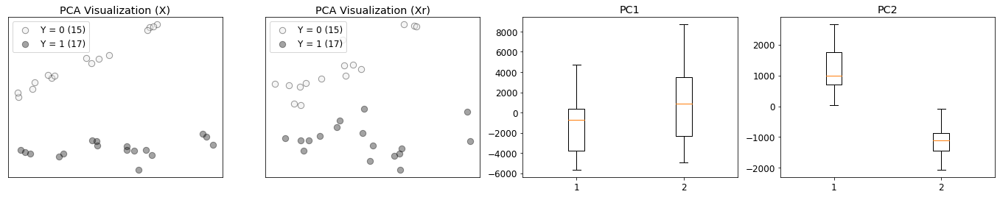


 ------ Class-wise Multivarate KLD on 2 PCA components -----
Multivarate KLD between the orignal and reconstructed signals ( y = 0):  1.353
Multivarate KLD between the orignal and reconstructed signals ( y = 1):  0.535

 ------ Class-wise Multivarate KLD on LDA component -----
KLD between the orignal and reconstructed signals ( y = 1):  0.186


===== Ψ = DCT, k =0.3 ======

Sample 1


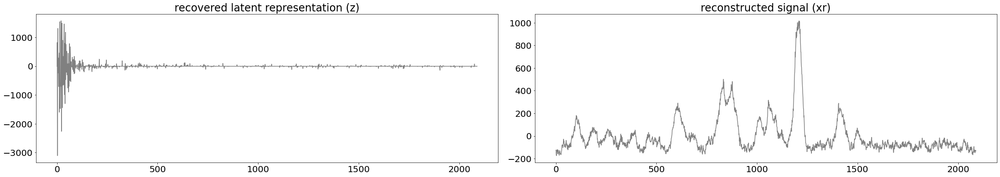

Sample 2


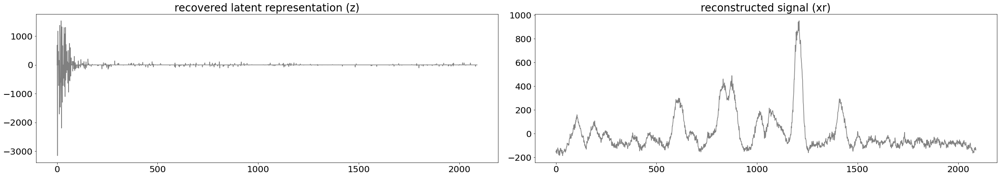

Sample 3


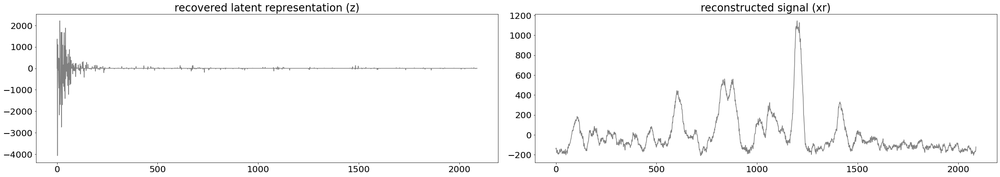

Sample 4


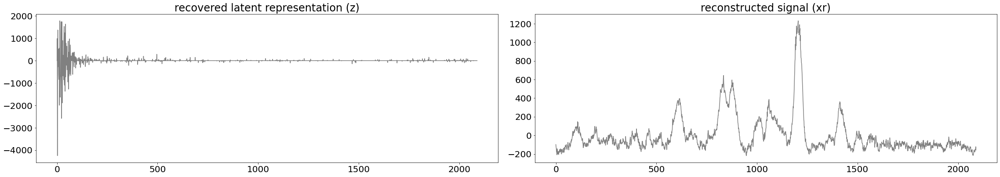

Sample 5


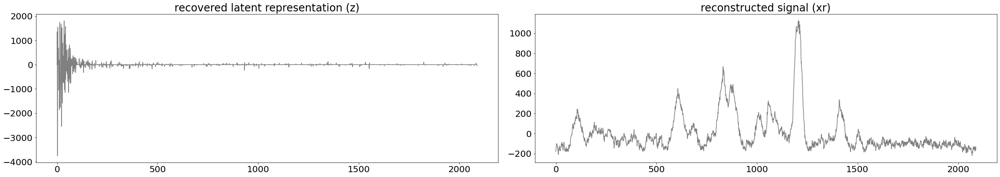

Sample 6


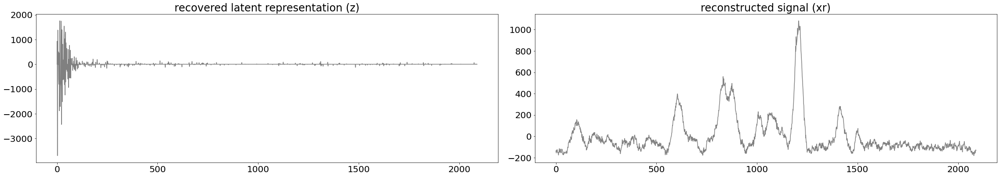

Sample 7


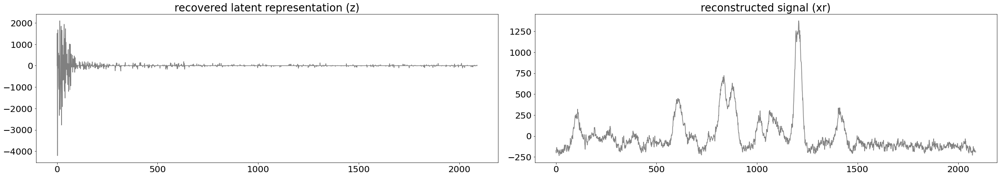

Sample 8


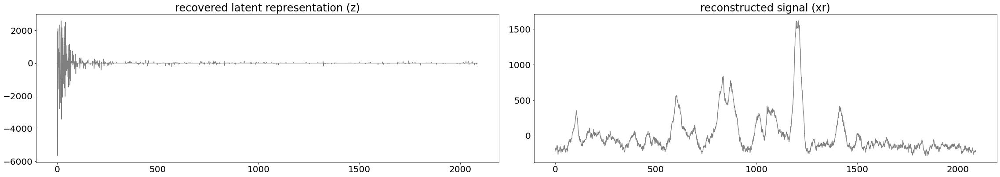

Sample 9


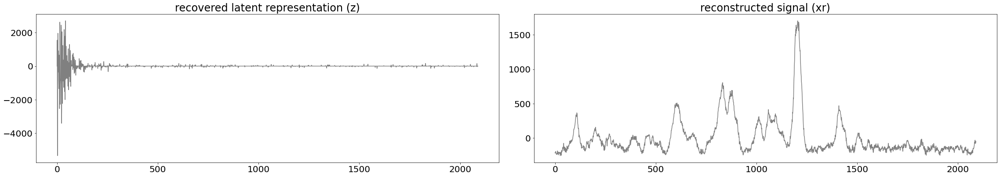

Sample 10


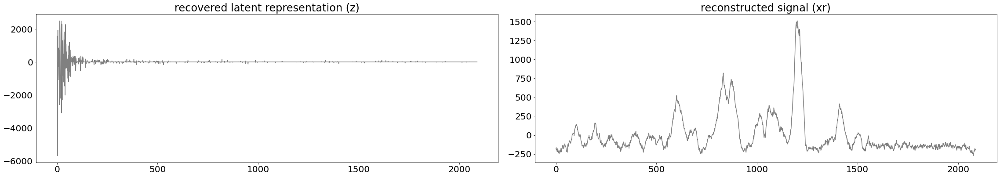

Sample 11


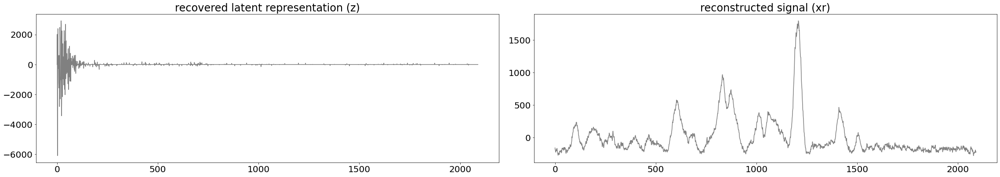

Sample 12


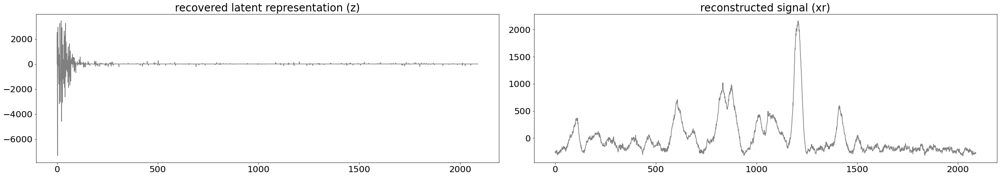

Sample 13


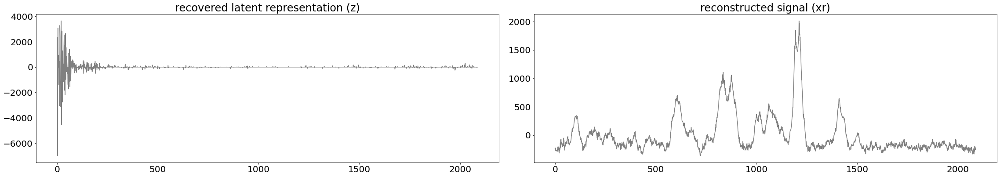

Sample 14


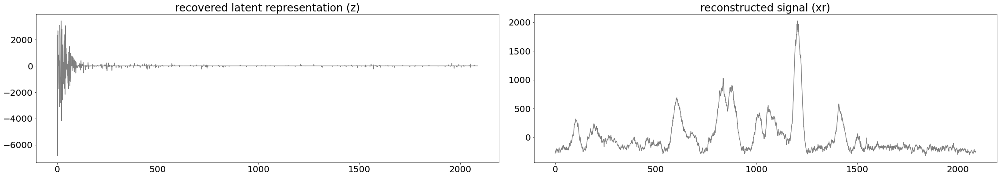

Sample 15


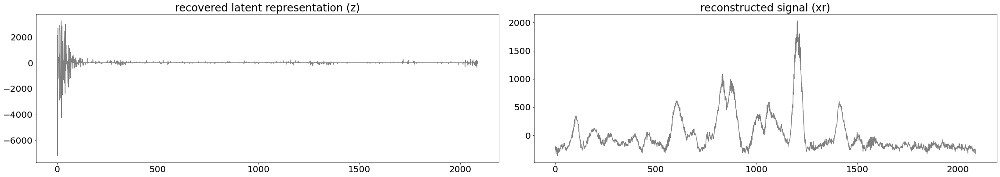

Sample 16


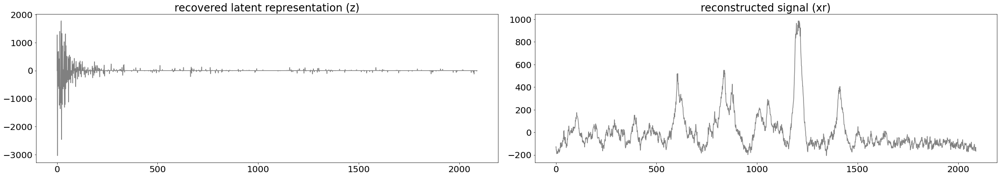

Sample 17


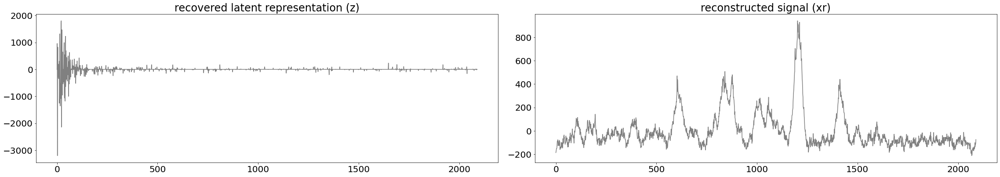

Sample 18


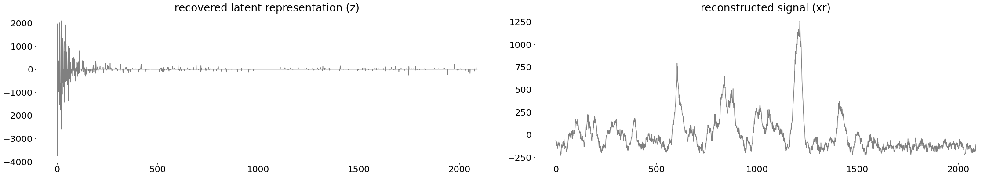

Sample 19


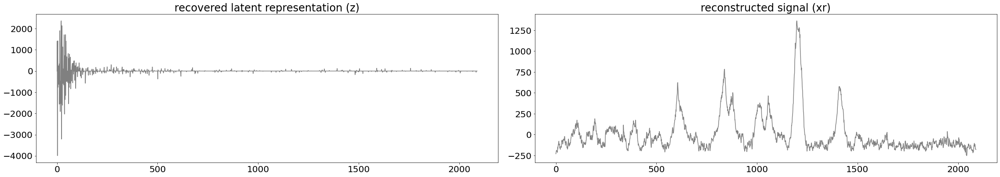

Sample 20


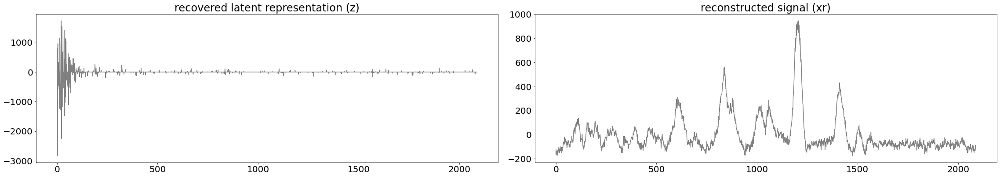

Sample 21


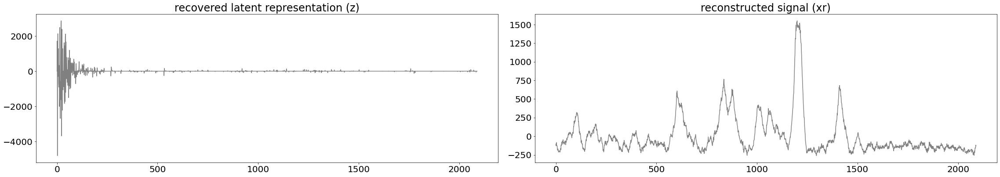

Sample 22


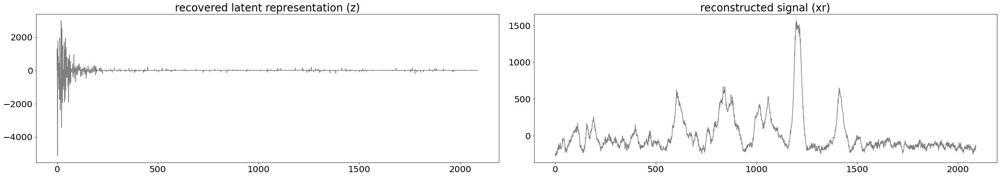

Sample 23


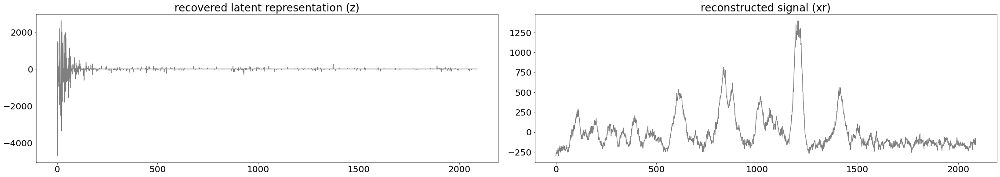

Sample 24


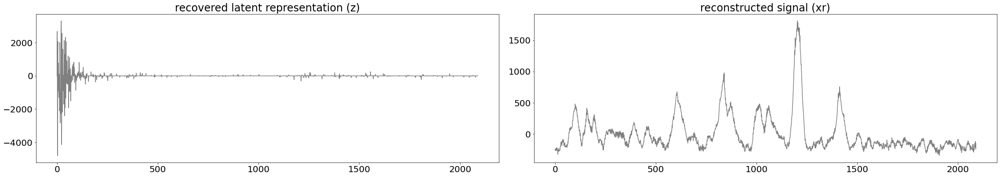

Sample 25


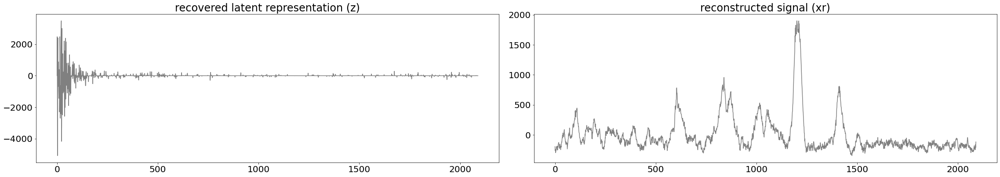

Sample 26


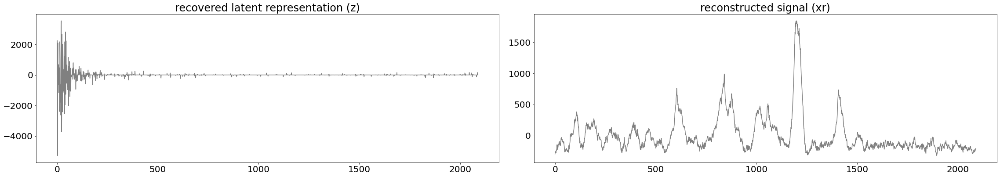

Sample 27


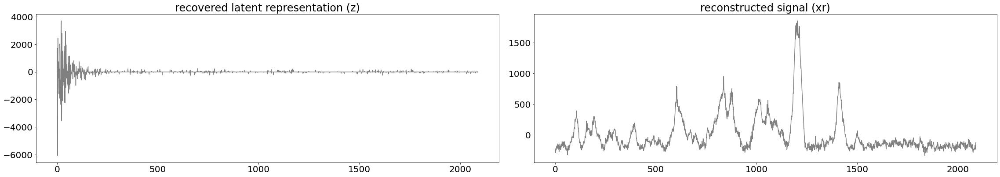

Sample 28


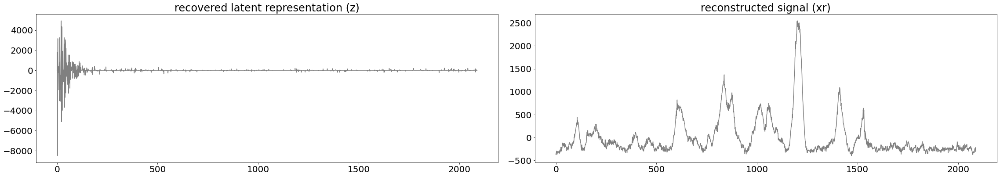

Sample 29


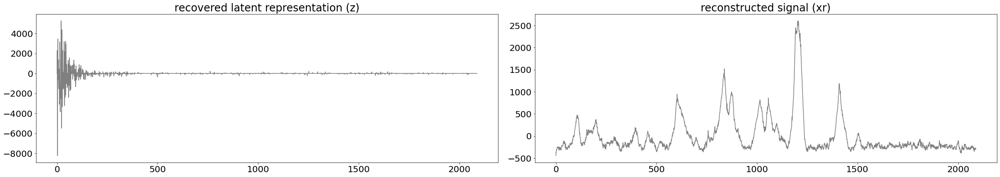

Sample 30


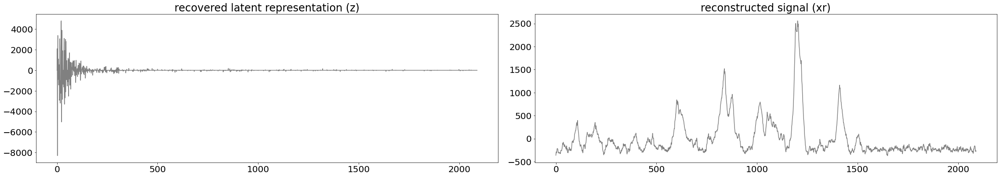

Sample 31


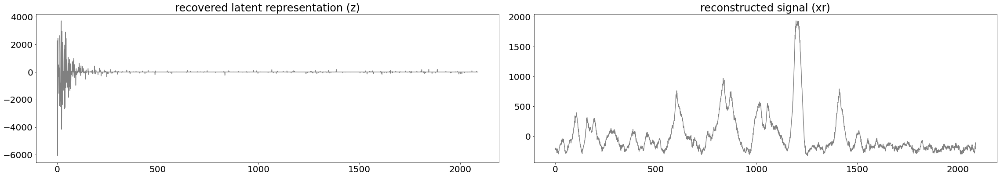

Sample 32


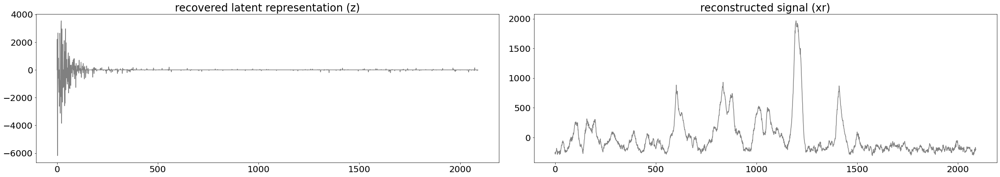

f=1.7856153103939711,p=0.19150914324465879
f=150.138068322288,p=3.306595704406753e-13
['PC1', 'PC2']
['Intercept', 'y']
                  Multivariate linear model
                                                             
-------------------------------------------------------------
        Intercept        Value  Num DF  Den DF F Value Pr > F
-------------------------------------------------------------
           Wilks' lambda 0.1893 2.0000 29.0000 62.0955 0.0000
          Pillai's trace 0.8107 2.0000 29.0000 62.0955 0.0000
  Hotelling-Lawley trace 4.2825 2.0000 29.0000 62.0955 0.0000
     Roy's greatest root 4.2825 2.0000 29.0000 62.0955 0.0000
-------------------------------------------------------------
                                                             
-------------------------------------------------------------
           y            Value  Num DF  Den DF F Value  Pr > F
-------------------------------------------------------------
          Wilks' lambda 0.1104

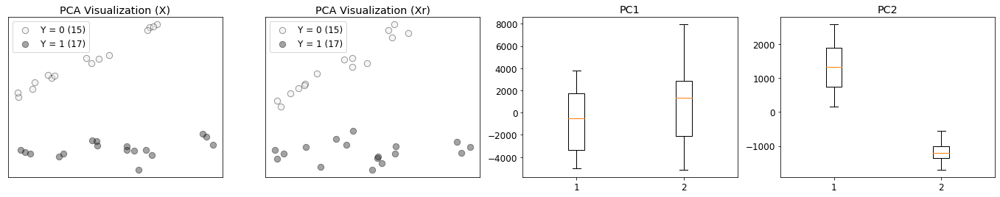


 ------ Class-wise Multivarate KLD on 2 PCA components -----
Multivarate KLD between the orignal and reconstructed signals ( y = 0):  2.363
Multivarate KLD between the orignal and reconstructed signals ( y = 1):  0.309

 ------ Class-wise Multivarate KLD on LDA component -----
KLD between the orignal and reconstructed signals ( y = 1):  0.308


===== Ψ = DCT, k =0.4 ======

Sample 1


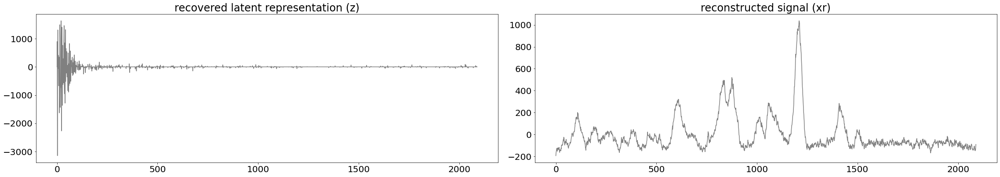

Sample 2


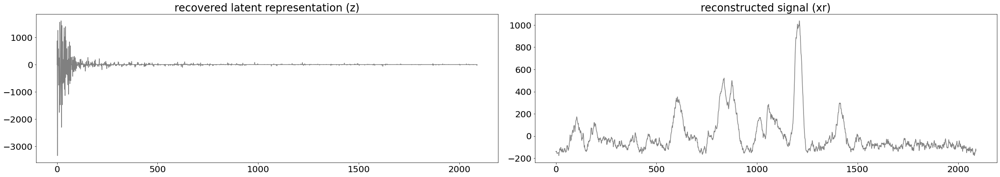

Sample 3


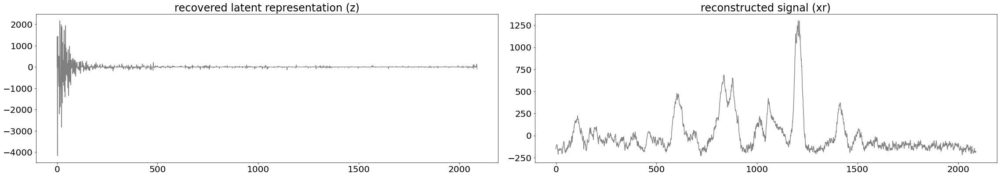

Sample 4


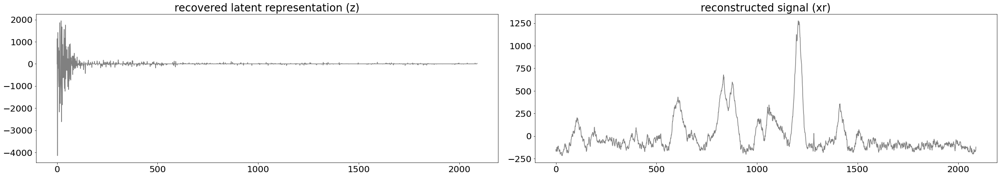

Sample 5


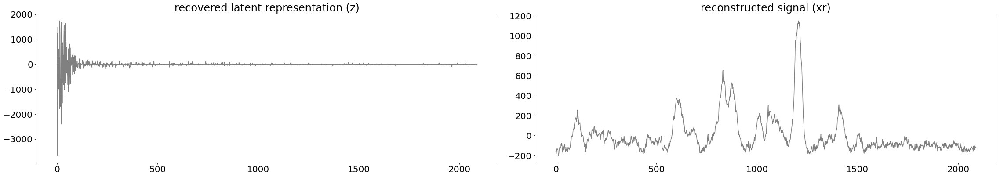

Sample 6


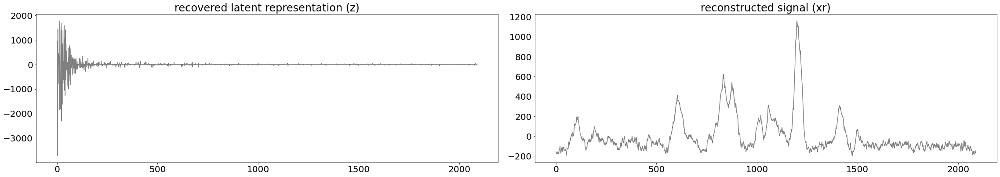

Sample 7


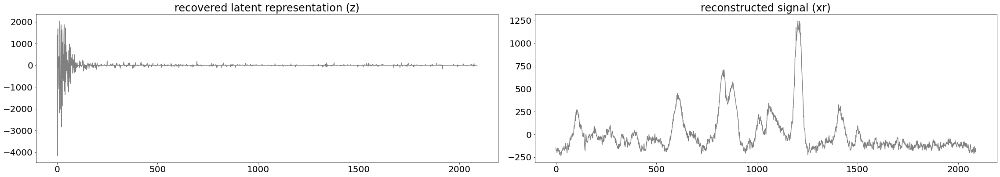

Sample 8


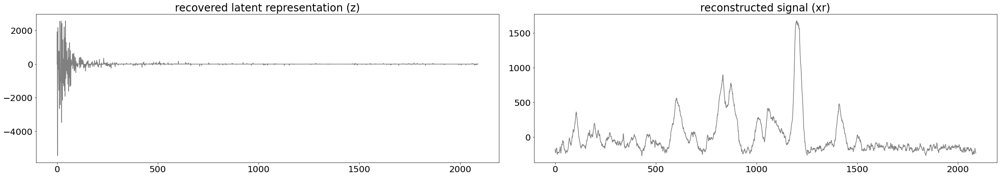

Sample 9


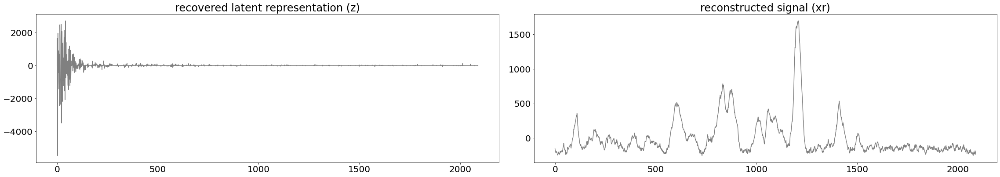

Sample 10


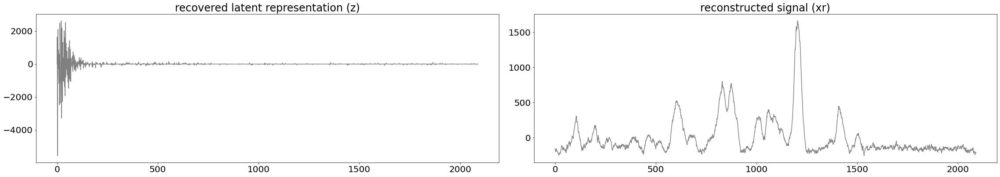

Sample 11


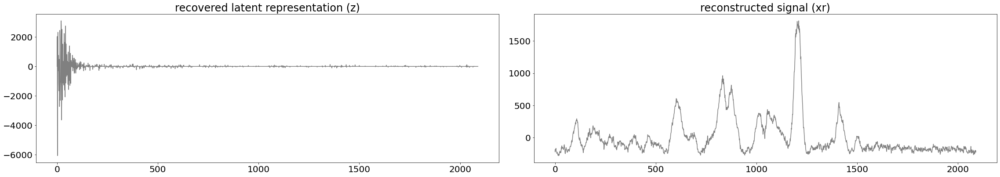

Sample 12


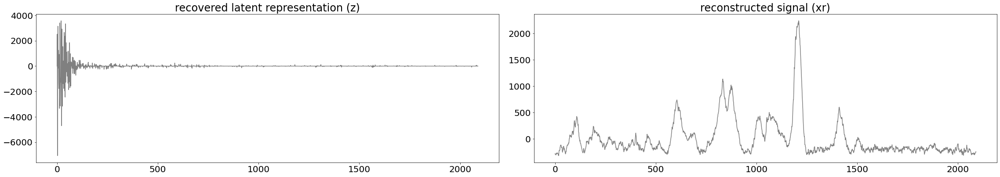

Sample 13


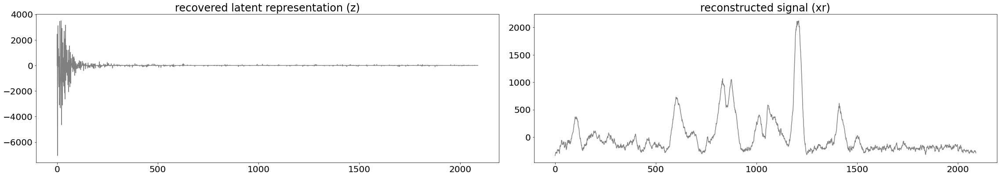

Sample 14


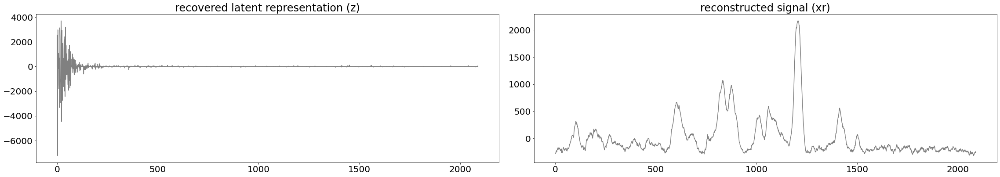

Sample 15


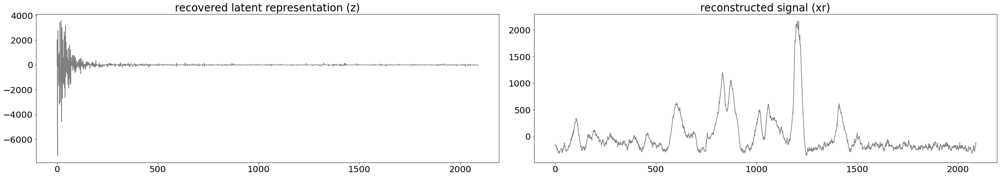

Sample 16


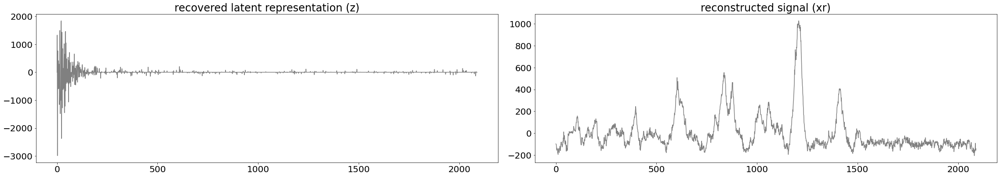

Sample 17


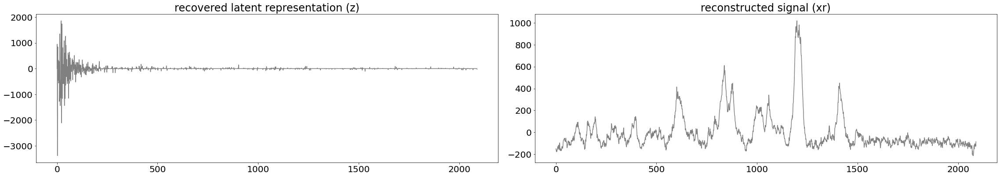

Sample 18


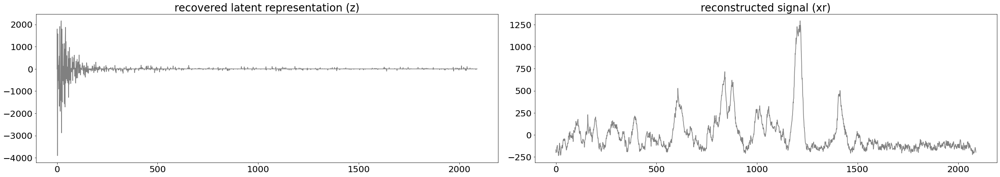

Sample 19


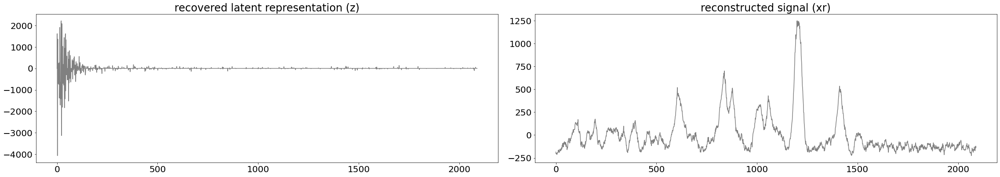

Sample 20


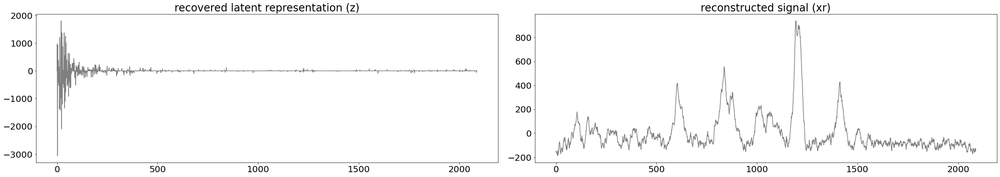

Sample 21


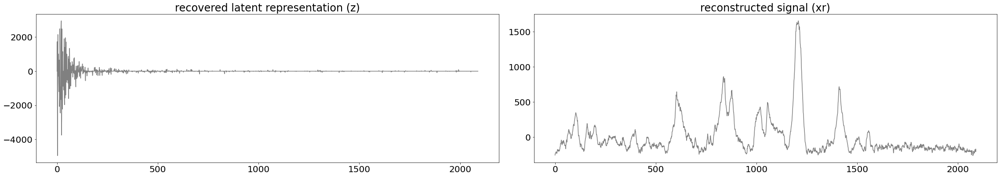

Sample 22


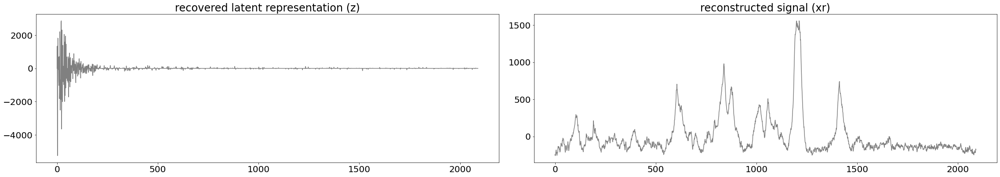

Sample 23


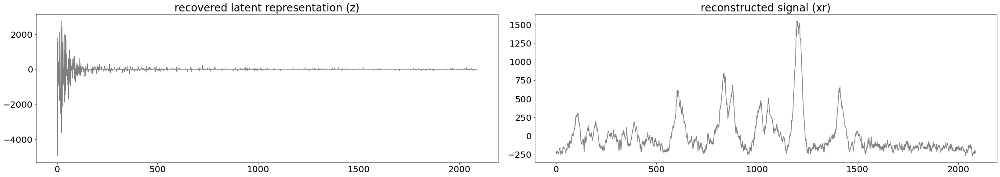

Sample 24


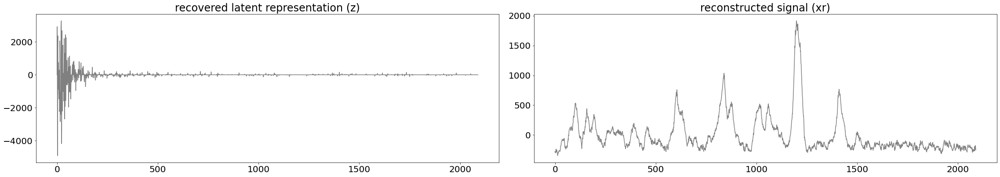

Sample 25


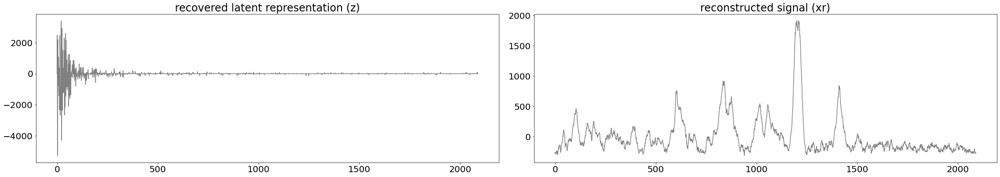

Sample 26


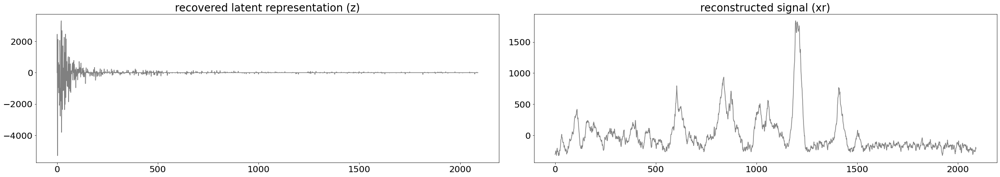

Sample 27


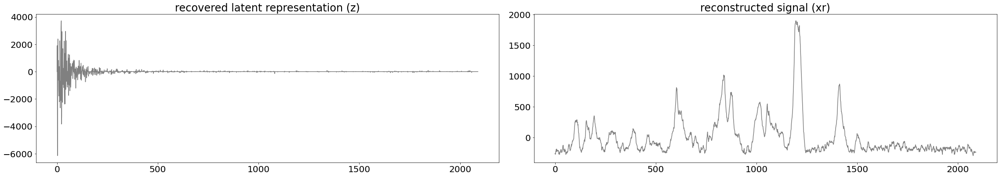

Sample 28


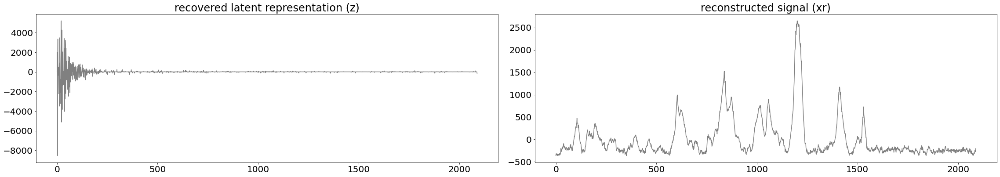

Sample 29


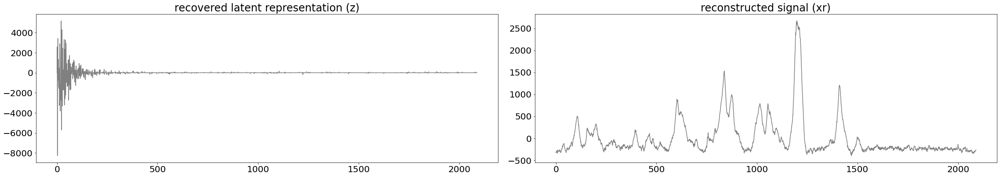

Sample 30


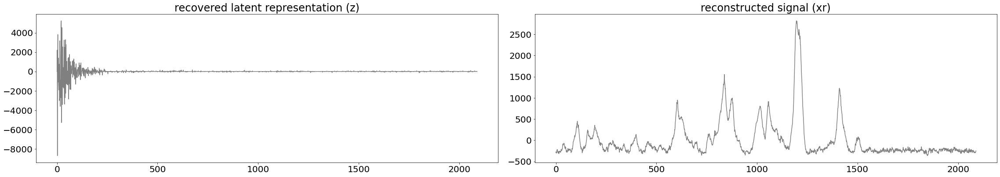

Sample 31


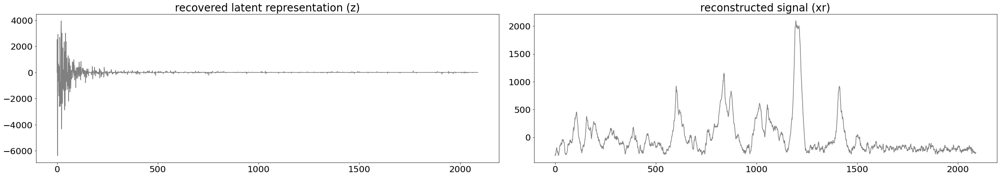

Sample 32


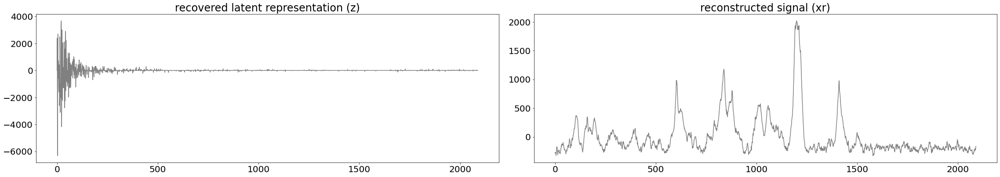

f=1.825278547878488,p=0.18678834978212985
f=158.91148659053053,p=1.613347744558299e-13
['PC1', 'PC2']
['Intercept', 'y']
                  Multivariate linear model
                                                             
-------------------------------------------------------------
        Intercept        Value  Num DF  Den DF F Value Pr > F
-------------------------------------------------------------
           Wilks' lambda 0.1753 2.0000 29.0000 68.2261 0.0000
          Pillai's trace 0.8247 2.0000 29.0000 68.2261 0.0000
  Hotelling-Lawley trace 4.7052 2.0000 29.0000 68.2261 0.0000
     Roy's greatest root 4.7052 2.0000 29.0000 68.2261 0.0000
-------------------------------------------------------------
                                                             
-------------------------------------------------------------
           y            Value  Num DF  Den DF F Value  Pr > F
-------------------------------------------------------------
          Wilks' lambda 0.101

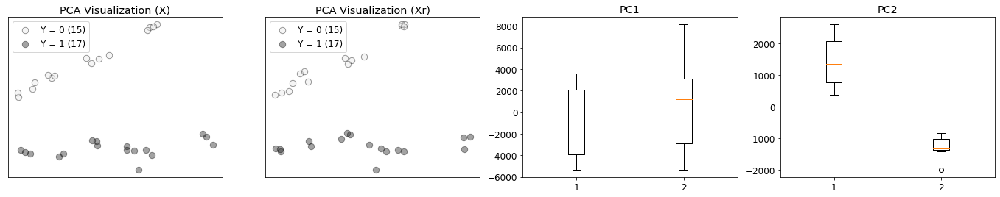


 ------ Class-wise Multivarate KLD on 2 PCA components -----
Multivarate KLD between the orignal and reconstructed signals ( y = 0):  1.419
Multivarate KLD between the orignal and reconstructed signals ( y = 1):  0.154

 ------ Class-wise Multivarate KLD on LDA component -----
KLD between the orignal and reconstructed signals ( y = 1):  0.143


TypeError: type numpy.ndarray doesn't define __round__ method

In [17]:
from IPython.core.display import display, HTML

result = {}

for k in [0.1, 0.2, 0.3, 0.4]:
    acc, manova = cs.Dataset_Sensing_n_Recovery (X, y, k=k)
    result['k = ' + str(k)] = (acc, manova)

NOTE:   
Due to randomness in the sampling process, the result may vary within a certain range from time to time. 

No matter we use the sparse representation z in latent space, or the reconstructed data in the origial space, the 2D visualizations after PCA are the same. Therefore, only the visualization of reconstructed x is shown.  

When k = 0.1, the original discriminative structures in the data is lost (some samples from two classes begin to overlap), and the MANOVA under some $\lambda$ test cannot reject the null-hypothesis $H_0$.   
k = 0.2 well preserves the discriminative structure. This result also supports the four-to-one rule.  

## Compare PSIs

Also output the dynamic property: See how RMSE changes with k.


-------------
The following are dynamic properties of each PSI:


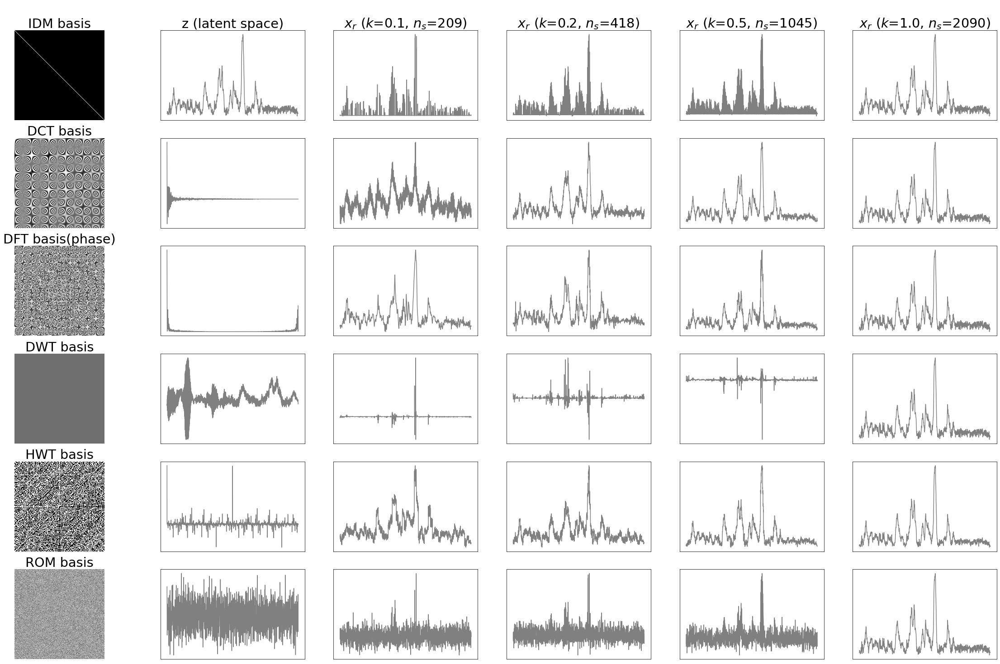

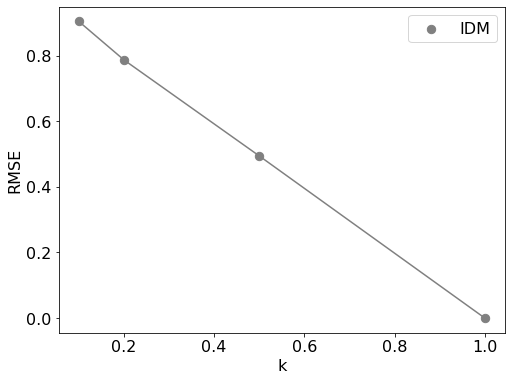

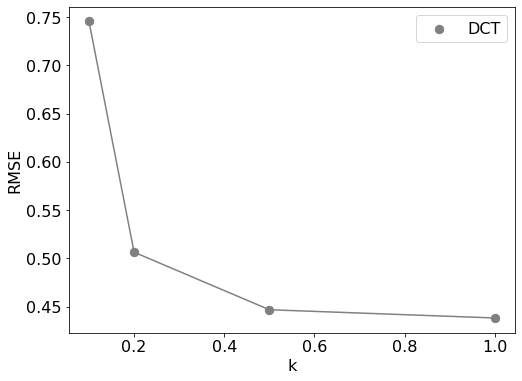

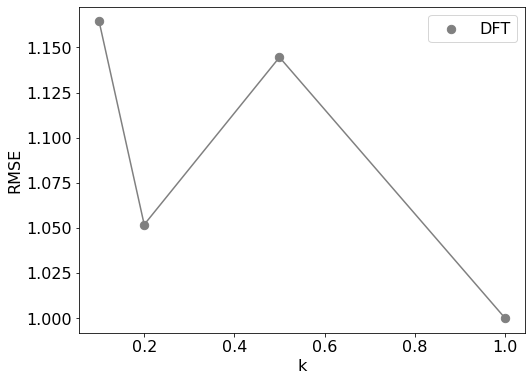

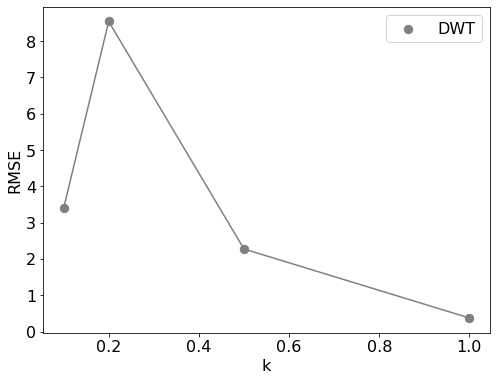

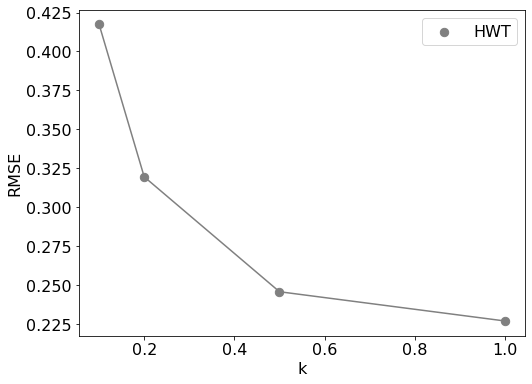

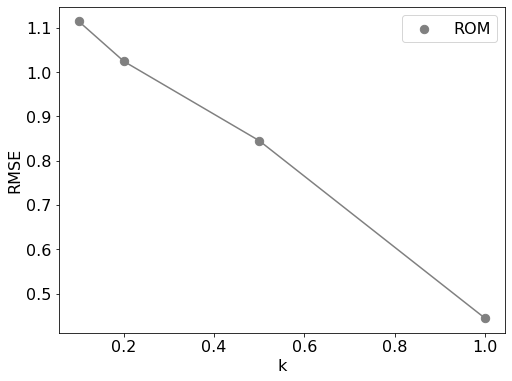

In [3]:
from cs1 import cs
rmses = cs.GridSearch_Sensing_n_Recovery(X[0], PSIs, solver = 'LASSO')


-------------
The following are dynamic properties of each PSI:


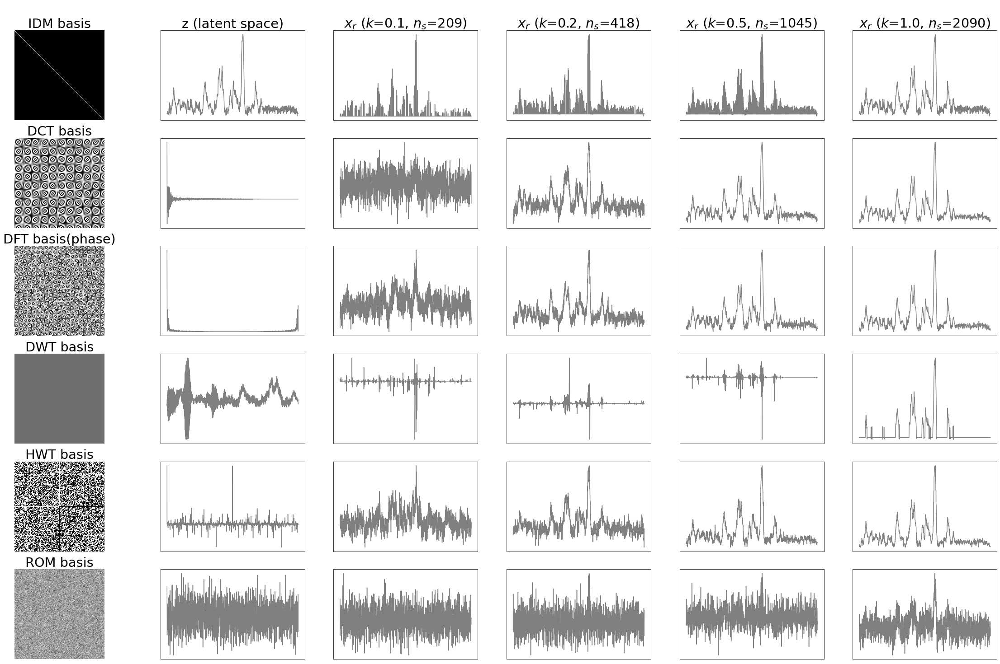

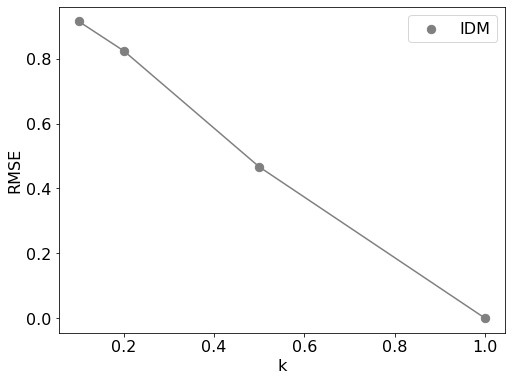

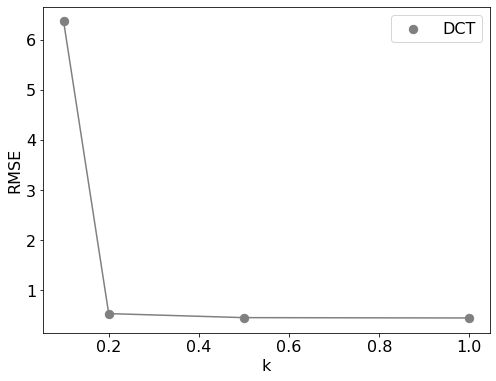

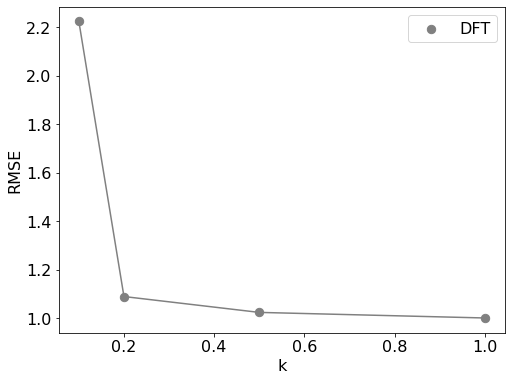

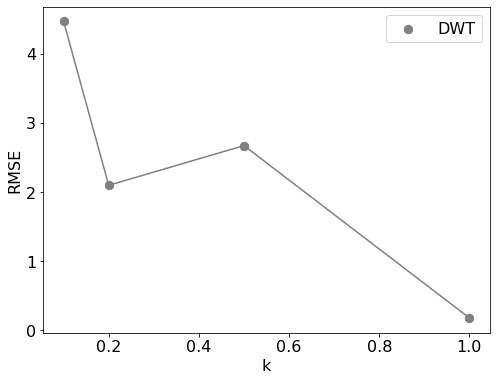

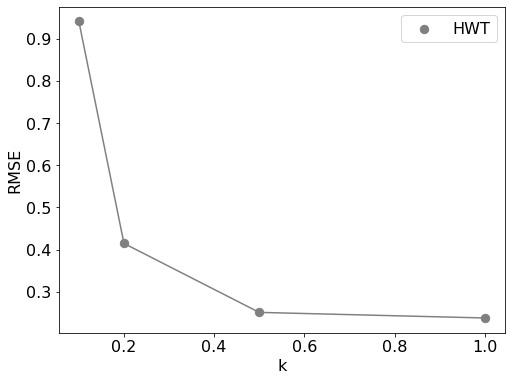

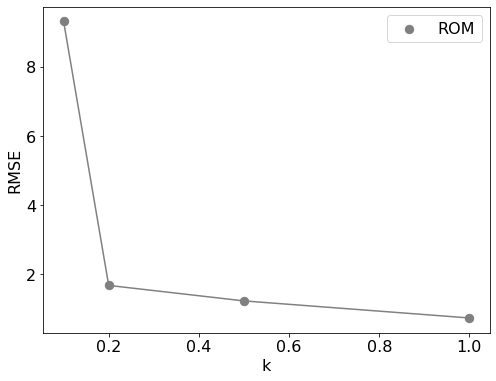

In [4]:
rmses = cs.GridSearch_Sensing_n_Recovery(X[0], PSIs, solver = 'OMP')

#### Extra Experiment

压缩2，丢弃DCT的高频部分，保留DCT频域中的前10%的低频信息量 （JPEG压缩原理）

non-zero elements:  609
Compression ratio =  15 %


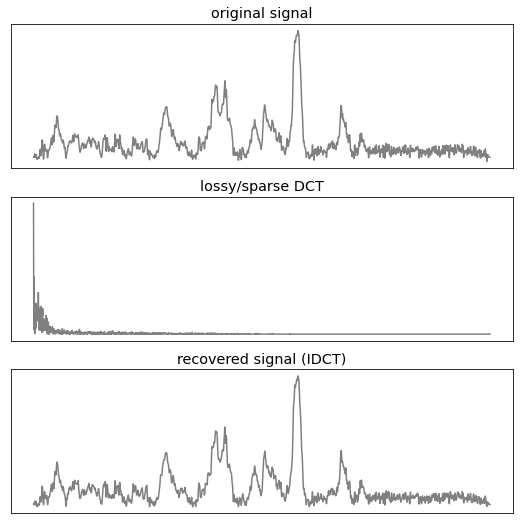

In [5]:
import cs1.domain.audio
_ = cs1.domain.audio.dct_lossy_signal_compression(X[0], 85)

仅保留前5%信息量。虽然主体特征峰轮廓得以保留，但高频细节丢失殆尽

#### Extra Experiment


non-zero elements:  629
Compression ratio =  15 %


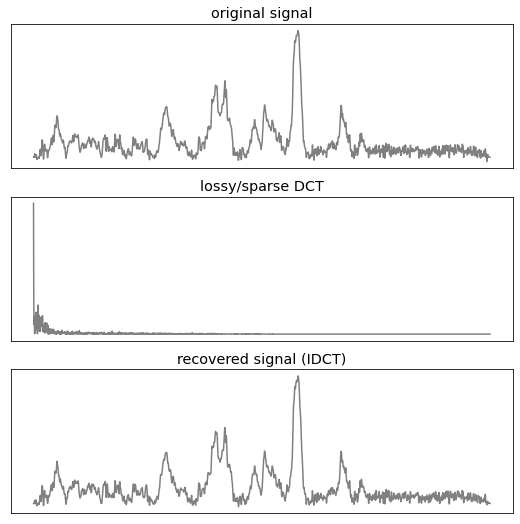

In [6]:
_ = cs1.domain.audio.dft_lossy_signal_compression(X[0], 85)

同样仅取频域的前N%，对于拉曼光谱，FFT(DFT)优于DCT，FFT的能量更为集中


The Discrete Fourier Transform (DFT) and Discrete Cosine Transform (DCT) perform similar functions: they both decompose a finite-length discrete-time vector into a sum of scaled-and-shifted basis functions. The difference between the two is the type of basis function used by each transform; the DFT uses a set of harmonically-related complex exponential functions, while the DCT uses only (real-valued) cosine functions.

The DFT is widely used for general spectral analysis applications that find their way into a range of fields. It is also used as a building block for techniques that take advantage of properties of signals' frequency-domain representation, such as the overlap-save and overlap-add fast convolution algorithms.

The DCT is frequently used in lossy data compression applications, such as the JPEG image format. The property of the DCT that makes it quite suitable for compression is its high degree of "spectral compaction;" at a qualitative level, a signal's DCT representation tends to have more of its energy concentrated in a small number of coefficients (对于图像数据而言，不一定明显，本例中的光谱数据甚至呈现相反的特点) when compared to other transforms like the DFT. This is desirable for a compression algorithm; if you can approximately represent the original (time- or spatial-domain) signal using a relatively small set of DCT coefficients, then you can reduce your data storage requirement by only storing the DCT outputs that contain significant amounts of energy.

# Sample 2 - ECG

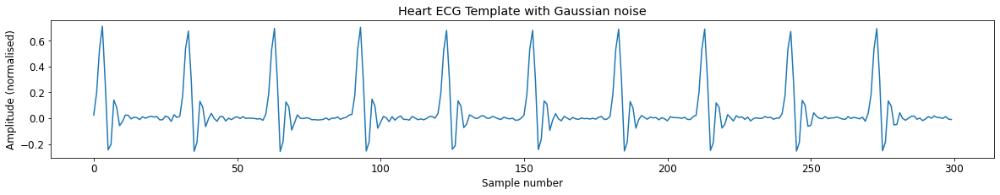

In [8]:
ecg = cs1.domain.audio.simulate_ECG(bpm = 60, time_length = 10)

non-zero elements:  60
Compression ratio =  10 %


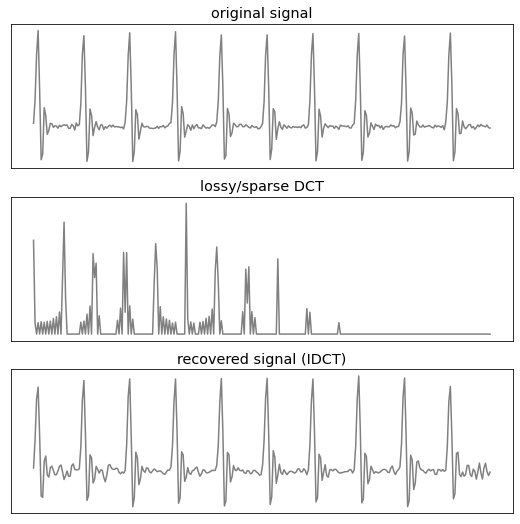

In [9]:
_ = cs1.domain.audio.dct_lossy_signal_compression(ecg, 90)

non-zero elements:  71
Compression ratio =  10 %


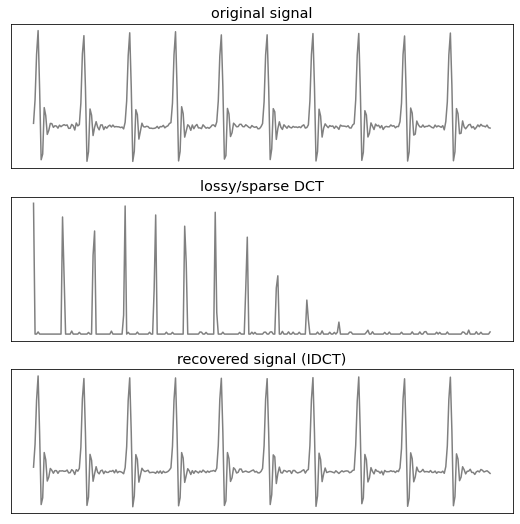

In [10]:
_ = cs1.domain.audio.dft_lossy_signal_compression(ecg, 90)

DFT的复原效果优于DCT，与数据（产生方式、频域特征等）高度相关

### Try the gaussian sensing matrix 

In [45]:
from cs1 import cs

n = len(xs)
xs, PHI = cs.Sensing(ecg, k = 0.5, flavor = 'gaussian')

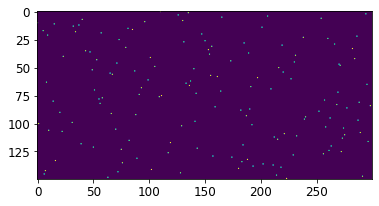

In [46]:
import matplotlib.pyplot as plt
plt.imshow(PHI)

In [47]:
PHI.shape

(150, 300)

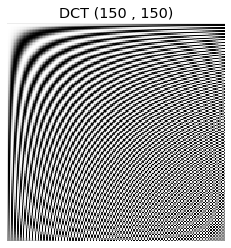

In [48]:
PSI = cs1.basis.common.dctmtx(n,n)

In [49]:
A = PSI @ PHI
A.shape, xs.shape

((150, 300), (150,))

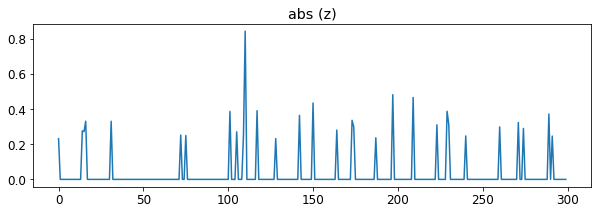

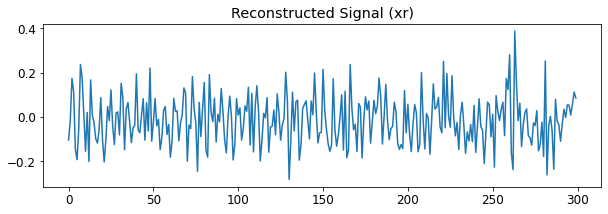

In [50]:
z, xr = cs.Recovery (A, xs, t = 'DCT', solver = 'OMP')

### compare with the 'scrambled identity' sensing matrix

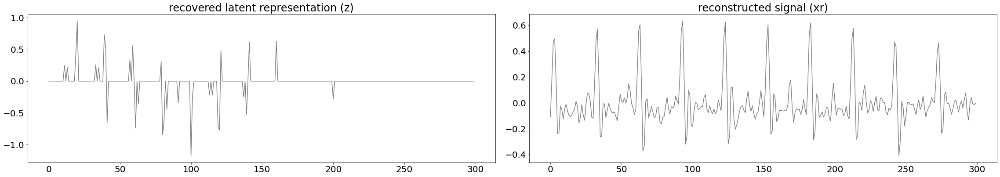

In [56]:
_ = cs.Sensing_n_Recovery(ecg, k = 0.5, t = 'DCT', solver = 'OMP')

# Supplement -  Math Symbol & Terms

CS	Compressed sensing

n	The original signal dimensionality. The length of the source signal.

m	The number of samples/signals/observations.

k	CS sampling rate, i.e., the percentage to be sampled from the original signal. Value range is (0,1]. A lower k means higher sampling efficiency but more info loss.  

$\Phi$ Sensing matrix. A kn-by-n square matrix.

$\Psi$ A transform basis. An n-by-n square matrix. It is a unitary matrix.

A	The measurement matrix.  . 

x	The original sample/observation/signal.

X	The training dataset. An m-by-n matrix.

z	Signal representation in the latent space.  

xs	Sampled signal.  

$n_s$	The dimensionality of the sampled signal xs. In CS, ns means how many points to be randomly picked from the original signal x.

xr	Reconstructed signal.

rank	The number of linearly-independent column/row vectors of a matrix. For the measurement matrix A, rank(A) = kn.
column space	The column space of a matrix A is the set of all possible outputs of 𝐴𝑣⃗ (𝑣⃗ is any arbitrary vector).

null space	The set of vectors that become  (lose their identities) after transform A, i.e., all solutions to . Column space is also known as the kernel of a matrix.

nullity	The dimension of the null space/kernel.

rank-nullity theorem	rank(A) + nullity(A) = column number(A), i.e., the nullity of A is the complement to its rank.

I, or IDM	An identity matrix

DCT	Discrete Cosine Transform

DFT	Discrete Fourier Transform

HWT	Hadamard-Walsh Transform

EBP	Eigenvector-Based Projection

SVD	Singular Value Decomposition.

U	The first orthogonal matrix (left "rotational" factor) of SVD. Columns in U are left eigen vectors.

S	The middle diagonal matrix from SVD. S represents the "stretch" factor in X. The diagonal elements are singular values.

si	The i-th singular value in S

V	The second orthogonal matrix (right "rotational" factor) of SVD. Columns in V are right eigenvectors. In the context of PCA, V is the component loadings.

PCA	Principal Component Analysis

K	In PCA, K (capital) is the number of principal components to be kept. 

Cov	The covariance matrix.

$\Lambda$  Eigen-value matrix.  comes from the SVD of Cov. 

λi	The i-th eigenvalue in $\Lambda$.

MSE	Mean square error. MSE is used to measure the reconstruction error of xr. 

RMSE	Relative mean square error.  

SNR	Signal-to-noise ratio.